In [1]:
import warnings
warnings.filterwarnings('ignore')

import os
import sys
import tarfile
from glob import glob
import csv
import gc
import time
import random
from io import BytesIO
from zipfile import ZipFile
from urllib.request import urlopen
import timm
import itertools 
import json
import functools

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageOps, UnidentifiedImageError
import cv2
from collections import Counter, defaultdict, namedtuple

from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from sklearn.metrics import (
    confusion_matrix,
    roc_curve,
    auc,
    f1_score,
    precision_score,
    recall_score,
    accuracy_score,
)

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.functional import normalize
import torch.optim as optim
from torch.autograd import Variable
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils import clip_grad_norm_
from torchinfo import summary as Summary

import torchvision.models as models
from torchvision import transforms, datasets
from torchvision.transforms.functional import InterpolationMode
from torchvision.transforms import v2
import torchvision.transforms.functional as TF
from torchvision.transforms import Compose, ToTensor, Normalize
from torch.utils.tensorboard import SummaryWriter

import albumentations as A
from albumentations.pytorch import ToTensorV2

from torchvision.transforms import ToPILImage
from torchmetrics.image import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure

from torchvision.transforms.functional import to_pil_image
import torchvision.utils as vutils
from torchvision.utils import make_grid, save_image, draw_bounding_boxes, draw_segmentation_masks
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

print('All modules imported succesfully !')


torch.cuda.empty_cache()

print("CUDA Available:", torch.cuda.is_available())
print("CUDA Device Count:", torch.cuda.device_count())
print(f"Device : { 'cuda' if torch.cuda.is_available() else 'cpu'}")
device = 'cuda' if torch.cuda.is_available() else 'cpu'

All modules imported succesfully !
CUDA Available: True
CUDA Device Count: 1
Device : cuda


In [8]:
class FaceMaskRemovalDataset(Dataset):
    def __init__(self, root_dir, transform=None, num_samples=None):
        self.masked_dir = os.path.join(root_dir, 'masked_images')
        self.original_dir = os.path.join(root_dir, 'original_images')
        self.mask_dir = os.path.join(root_dir, 'binary_masks')
        self.transform = transform
        self.paired_images = self._get_paired_images(num_samples)

    def _get_paired_images(self, num_samples=None):
        masked_images = glob(os.path.join(self.masked_dir, "*.jpg"))
        pairs = []
        if num_samples is not None:
            masked_images = masked_images[:min(len(masked_images), num_samples)]
        for masked_path in tqdm(masked_images):
            filename = os.path.basename(masked_path).split("_")[0] + ".jpg"
            original_path = os.path.join(self.original_dir, filename)
            mask_path = os.path.join(self.mask_dir, os.path.basename(masked_path).replace(".jpg", "_binary.jpg"))
            if os.path.exists(original_path) and os.path.exists(mask_path):
                pairs.append((masked_path, original_path, mask_path))
        return pairs

    def __len__(self):
        return len(self.paired_images)

    def __getitem__(self, idx):
        masked_path, original_path, mask_path = self.paired_images[idx]
    
        masked_img = Image.open(masked_path).convert("RGB")
        original_img = Image.open(original_path).convert("RGB")
        mask_img = Image.open(mask_path).convert("L")
    
        masked_img = np.array(masked_img)
        original_img = np.array(original_img)
        mask_img = np.array(mask_img)
    
        if self.transform:
            augmented = self.transform(image=masked_img, image0=original_img, mask=mask_img)
            masked_img = augmented["image"]
            original_img = augmented["image0"]
            mask_img = augmented["mask"]
    
        mask_img = mask_img.unsqueeze(0).float()  # (1, H, W)
        masked_input = torch.cat([masked_img, mask_img], dim=0)  # (4, H, W)
    
        return {
            'image': original_img,  # (3, H, W)
            'masked_input': masked_input,  # (4, H, W)
            'mask': mask_img,  # (1, H, W)
            'masked_image': masked_img  # (3, H, W)
        }


# Parameters
image_size = 64

transform = A.Compose(
    [
        A.Resize(image_size, image_size),
        A.HorizontalFlip(p=0.5),
        A.Rotate(limit=10),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ToTensorV2(),
    ],
    additional_targets={"image0": "image", "mask": "mask"},
)

dataset = FaceMaskRemovalDataset(
    root_dir='/kaggle/input/gan-dataset-with-masks/image_align_celeba_with_masks',
    transform=transform,
    num_samples=5000,
)

100%|██████████| 5000/5000 [00:02<00:00, 1823.19it/s]


In [9]:
batch_size = 128 
transform = A.Compose([
    A.Resize(image_size, image_size),
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=10),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2(),
], additional_targets={"image0": "image", "mask": "mask"}) 


# Split into train and validation
train_size = int(0.9 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)

In [16]:
class Vgg16(torch.nn.Module):
    def __init__(self):
        super(Vgg16, self).__init__()
        features = models.vgg16(pretrained=True).features
        self.relu1_1 = torch.nn.Sequential()
        self.relu1_2 = torch.nn.Sequential()

        self.relu2_1 = torch.nn.Sequential()
        self.relu2_2 = torch.nn.Sequential()

        self.relu3_1 = torch.nn.Sequential()
        self.relu3_2 = torch.nn.Sequential()
        self.relu3_3 = torch.nn.Sequential()
        self.max3 = torch.nn.Sequential()


        self.relu4_1 = torch.nn.Sequential()
        self.relu4_2 = torch.nn.Sequential()
        self.relu4_3 = torch.nn.Sequential()


        self.relu5_1 = torch.nn.Sequential()
        self.relu5_2 = torch.nn.Sequential()
        self.relu5_3 = torch.nn.Sequential()

        for x in range(2):
            self.relu1_1.add_module(str(x), features[x])

        for x in range(2, 4):
            self.relu1_2.add_module(str(x), features[x])

        for x in range(4, 7):
            self.relu2_1.add_module(str(x), features[x])

        for x in range(7, 9):
            self.relu2_2.add_module(str(x), features[x])

        for x in range(9, 12):
            self.relu3_1.add_module(str(x), features[x])

        for x in range(12, 14):
            self.relu3_2.add_module(str(x), features[x])

        for x in range(14, 16):
            self.relu3_3.add_module(str(x), features[x])
        for x in range(16, 17):
            self.max3.add_module(str(x), features[x])

        for x in range(17, 19):
            self.relu4_1.add_module(str(x), features[x])

        for x in range(19, 21):
            self.relu4_2.add_module(str(x), features[x])

        for x in range(21, 23):
            self.relu4_3.add_module(str(x), features[x])

        for x in range(23, 26):
            self.relu5_1.add_module(str(x), features[x])

        for x in range(26, 28):
            self.relu5_2.add_module(str(x), features[x])

        for x in range(28, 30):
            self.relu5_3.add_module(str(x), features[x])


        for param in self.parameters():
            param.requires_grad = False

    def forward(self, x):
        relu1_1 = self.relu1_1(x)
        relu1_2 = self.relu1_2(relu1_1)

        relu2_1 = self.relu2_1(relu1_2)
        relu2_2 = self.relu2_2(relu2_1)

        relu3_1 = self.relu3_1(relu2_2)
        relu3_2 = self.relu3_2(relu3_1)
        relu3_3 = self.relu3_3(relu3_2)
        max_3 = self.max3(relu3_3)


        relu4_1 = self.relu4_1(max_3)
        relu4_2 = self.relu4_2(relu4_1)
        relu4_3 = self.relu4_3(relu4_2)


        relu5_1 = self.relu5_1(relu4_3)
        relu5_2 = self.relu5_1(relu5_1)
        relu5_3 = self.relu5_1(relu5_2)
        out = {
            'relu1_1': relu1_1,
            'relu1_2': relu1_2,

            'relu2_1': relu2_1,
            'relu2_2': relu2_2,

            'relu3_1': relu3_1,
            'relu3_2': relu3_2,
            'relu3_3': relu3_3,
            'max_3':max_3,


            'relu4_1': relu4_1,
            'relu4_2': relu4_2,
            'relu4_3': relu4_3,


            'relu5_1': relu5_1,
            'relu5_2': relu5_2,
            'relu5_3': relu5_3,
        }
        return out


class PerceptualLoss(nn.Module):
    def __init__(self, weights=[1.0, 1.0, 1.0, 1.0, 1.0]):
        super(PerceptualLoss, self).__init__()
        self.add_module('vgg', Vgg16().cuda())
        self.criterion = torch.nn.L1Loss()
        self.weights = weights
        self.vgg_normalize = transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )

    def preprocess(self, x):
        x = (x + 1) / 2  # from [-1, 1] -> [0, 1]
        return self.vgg_normalize(x)

    def __call__(self, x, y):
        x = self.preprocess(x)
        y = self.preprocess(y)

        x_vgg, y_vgg = self.vgg(x), self.vgg(y)

        content_loss = 0.0
        content_loss += self.weights[0] * self.criterion(x_vgg['relu1_1'], y_vgg['relu1_1'])
        content_loss += self.weights[1] * self.criterion(x_vgg['relu2_1'], y_vgg['relu2_1'])
        content_loss += self.weights[2] * self.criterion(x_vgg['relu3_1'], y_vgg['relu3_1'])
        content_loss += self.weights[3] * self.criterion(x_vgg['relu4_1'], y_vgg['relu4_1'])
        content_loss += self.weights[4] * self.criterion(x_vgg['relu5_1'], y_vgg['relu5_1'])

        return content_loss

class PartialConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super().__init__()
        self.input_conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.mask_conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)

        nn.init.constant_(self.mask_conv.weight, 1.0)
        for param in self.mask_conv.parameters():
            param.requires_grad = False

    def forward(self, x, mask):
        # mask is expected to be (B, 1, H, W) initially
        # If mask is only single channel, expand to match input channels
        if mask.shape[1] == 1:
            mask = mask.expand_as(x)

        x = x * mask
        output = self.input_conv(x)
        mask_output = self.mask_conv(mask)
        mask_output = torch.clamp(mask_output, 0, 1)

        # Normalize output only where mask is non-zero
        output = output / (mask_output + 1e-8)
        output = output * mask_output

        return output, mask_output

class PartialUNet(nn.Module):
    def __init__(self, in_channels=4, out_channels=3):
        super().__init__()
        # Encoder - 64x64 -> 32x32 -> 16x16 -> 8x8
        self.enc1 = PartialConv2d(in_channels, 64, 5, stride=2, padding=2)  # 64->32
        self.enc2 = PartialConv2d(64, 128, 3, stride=2, padding=1)         # 32->16
        self.enc3 = PartialConv2d(128, 256, 3, stride=2, padding=1)        # 16->8
        
        # Middle block - maintain spatial dimensions
        self.middle = PartialConv2d(256, 256, 3, stride=1, padding=1)      # 8->8
        
        # Decoder - 8x8 -> 16x16 -> 32x32 -> 64x64
        self.dec3 = nn.ConvTranspose2d(512, 128, 4, stride=2, padding=1)   # 8->16
        self.dec2 = nn.ConvTranspose2d(256, 64, 4, stride=2, padding=1)    # 16->32
        self.dec1 = nn.ConvTranspose2d(128, out_channels, 4, stride=2, padding=1) # 32->64
        
        # Normalization
        self.norm = nn.InstanceNorm2d
        self.bn256 = self.norm(256)
        self.bn128 = self.norm(128)
        self.bn64 = self.norm(64)

    def forward(self, x, mask):
        # Encoder
        e1, m1 = self.enc1(x, mask)
        e1 = F.leaky_relu(self.bn64(e1), 0.2)
        
        e2, m2 = self.enc2(e1, m1)
        e2 = F.leaky_relu(self.bn128(e2), 0.2)
        
        e3, m3 = self.enc3(e2, m2)
        e3 = F.leaky_relu(self.bn256(e3), 0.2)
        
        # Middle
        mid, _ = self.middle(e3, m3)
        mid = F.leaky_relu(self.bn256(mid), 0.2)
        
        # Decoder with skip connections
        d3 = F.leaky_relu(self.bn128(self.dec3(torch.cat([mid, e3], 1))), 0.2)
        d2 = F.leaky_relu(self.bn64(self.dec2(torch.cat([d3, e2], 1))), 0.2)
        d1 = torch.tanh(self.dec1(torch.cat([d2, e1], 1)))
        
        return d1

class PatchDiscriminator(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        
        def discriminator_block(in_filters, out_filters, normalize=True):
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(in_channels, 64, normalize=False),  # 64->32
            *discriminator_block(64, 128),                          # 32->16
            *discriminator_block(128, 256),                         # 16->8
            nn.Conv2d(256, 1, kernel_size=3, padding=1),           # 8->8
            nn.Sigmoid()
        )

    def forward(self, img):
        return self.model(img)


class InpaintingTrainer:
    def __init__(self, generator, discriminator, device, lambda_l1=1.0, lambda_adv=0.01, lambda_recon=10.0, lambda_perceptual=0.1):
        """
        Initialize the InpaintingTrainer
        
        Args:
            generator: Generator model (PartialUNet)
            discriminator: Discriminator model (PatchDiscriminator)
            device: Device to use for training ('cuda' or 'cpu')
            lambda_l1: Weight for L1 loss
            lambda_adv: Weight for adversarial loss
        """
        self.generator = generator.to(device)
        self.discriminator = discriminator.to(device)
        self.device = device
        self.bce_loss = nn.BCEWithLogitsLoss()
        self.l1_loss = nn.L1Loss()
        self.perceptual_loss = PerceptualLoss()
        self.lambda_l1 = lambda_l1
        self.lambda_adv = lambda_adv
        self.lambda_recon = lambda_recon
        self.lambda_perceptual = lambda_perceptual
        

    def compute_batch_psnr(self, real_batch, fake_batch):
        real_batch = real_batch.clamp(-1, 1).detach().cpu().numpy()
        fake_batch = fake_batch.clamp(-1, 1).detach().cpu().numpy()
    
        real_batch = (real_batch + 1) / 2  # Rescale to [0, 1]
        fake_batch = (fake_batch + 1) / 2
    
        psnr_values = []
        for i in range(real_batch.shape[0]):
            psnr = peak_signal_noise_ratio(real_batch[i].transpose(1, 2, 0), fake_batch[i].transpose(1, 2, 0), data_range=1.0)
            psnr_values.append(psnr)
    
        return np.mean(psnr_values)

    def compute_batch_ssim(self, real_batch, fake_batch):
        real_batch = real_batch.clamp(-1, 1).detach().cpu().numpy()
        fake_batch = fake_batch.clamp(-1, 1).detach().cpu().numpy()
    
        real_batch = (real_batch + 1) / 2  # Rescale to [0, 1]
        fake_batch = (fake_batch + 1) / 2
    
        ssim_values = []
        for i in range(real_batch.shape[0]):
            ssim_value = structural_similarity(
                real_batch[i].transpose(1, 2, 0),
                fake_batch[i].transpose(1, 2, 0),
                multichannel=True,
                data_range=1.0,
                win_size=3  # Here is the change
            )
            ssim_values.append(ssim_value)
    
        return np.mean(ssim_values)
    
    def train_step(self, batch, g_optimizer, d_optimizer):
        real_images = batch['image'].to(self.device)
        masked_inputs = batch['masked_input'].to(self.device)
        masks = batch['mask'].float().to(self.device) / 255.0

    
        # ----------------------
        # Train Discriminator
        # ----------------------
        self.generator.eval()
        self.discriminator.train()
    
        with torch.no_grad():
            fake_images = self.generator(masked_inputs, masks)
    
        real_preds = self.discriminator(real_images)
        fake_preds = self.discriminator(fake_images.detach())
    
        real_labels = torch.ones_like(real_preds, device=self.device)
        fake_labels = torch.zeros_like(fake_preds, device=self.device)
    
        d_real_loss = self.bce_loss(real_preds, real_labels)
        d_fake_loss = self.bce_loss(fake_preds, fake_labels)
        d_loss = (d_real_loss + d_fake_loss) / 2
    
        d_optimizer.zero_grad()
        d_loss.backward()
        d_optimizer.step()
    
        # ----------------------
        # Train Generator
        # ----------------------
        self.generator.train()
        self.discriminator.eval()
    
        fake_images = self.generator(masked_inputs, masks)
        fake_preds = self.discriminator(fake_images)
    
        g_adv_loss = self.bce_loss(fake_preds, torch.ones_like(fake_preds, device=self.device))
        g_l1_loss = self.l1_loss(fake_images, real_images)
    
        # Expand mask to 3 channels for im_recon
        masks_expanded = masks.expand_as(real_images)
    
        # Reconstruction loss on masked region
        im_recon = real_images * (1 - masks_expanded) + fake_images * masks_expanded
        g_recon_loss = self.l1_loss(real_images * masks_expanded, im_recon * masks_expanded)

        
        # Perceptual Loss
        g_perceptual_loss = self.perceptual_loss(fake_images, real_images)
    
        g_loss = (
            self.lambda_l1 * g_l1_loss
            + self.lambda_adv * g_adv_loss
            + self.lambda_recon * g_recon_loss
            + self.lambda_perceptual * g_perceptual_loss
        )
    
        g_optimizer.zero_grad()
        g_loss.backward()
        g_optimizer.step()
    
        # ----------------------
        # Compute PSNR and SSIM for batch
        # ----------------------
        batch_psnr = self.compute_batch_psnr(real_images, fake_images)
        batch_ssim = self.compute_batch_ssim(real_images, fake_images)
    
        return {
            'g_loss': g_loss.item(),
            'd_loss': d_loss.item(),
            'g_l1_loss': g_l1_loss.item(),
            'g_adv_loss': g_adv_loss.item(),
            'g_recon_loss': g_recon_loss.item(),
            'g_perceptual_loss': g_perceptual_loss.item(),
            'psnr': batch_psnr,
            'ssim': batch_ssim,
            'fake_images': fake_images.detach()
        }

    
    def train_epoch(self, dataloader, g_optimizer, d_optimizer):
        epoch_metrics = {
            'g_loss': 0,
            'd_loss': 0,
            'g_l1_loss': 0,
            'g_adv_loss': 0,
            'g_recon_loss': 0,
            'g_perceptual_loss': 0,
            'psnr': 0,
            'ssim': 0
        }
    
        pbar = tqdm(dataloader, desc="Training")
        for batch in pbar:
            metrics = self.train_step(batch, g_optimizer, d_optimizer)
    
            for key in epoch_metrics:
                epoch_metrics[key] += metrics[key]
    
            avg_metrics = {k: v / (pbar.n + 1) for k, v in epoch_metrics.items()}
            pbar.set_postfix({k: f"{v:.4f}" for k, v in avg_metrics.items()})
    
        return {k: v / len(dataloader) for k, v in epoch_metrics.items()}

    def validate_epoch(self, dataloader):
        self.generator.eval()
        self.discriminator.eval()
    
        val_metrics = {
            'g_loss': 0,
            'd_loss': 0,
            'g_l1_loss': 0,
            'g_adv_loss': 0,
            'g_recon_loss': 0,
            'g_perceptual_loss': 0,
            'psnr': 0,
            'ssim': 0
        }
    
        pbar = tqdm(dataloader, desc="Validating")
        with torch.no_grad():
            for batch in pbar:
                real_images = batch['image'].to(self.device)
                masked_inputs = batch['masked_input'].to(self.device)
                masks = batch['mask'].float().to(self.device) / 255.0
    
                fake_images = self.generator(masked_inputs, masks)
    
                real_preds = self.discriminator(real_images)
                fake_preds = self.discriminator(fake_images)
    
                d_loss = (self.bce_loss(real_preds, torch.ones_like(real_preds, device=self.device)) +
                          self.bce_loss(fake_preds, torch.zeros_like(fake_preds, device=self.device))) / 2
    
                g_adv_loss = self.bce_loss(fake_preds, torch.ones_like(fake_preds, device=self.device))
                g_l1_loss = self.l1_loss(fake_images, real_images)
    
                # Expand mask to 3 channels for im_recon
                masks_expanded = masks.expand_as(real_images)
    
                im_recon = real_images * (1 - masks_expanded) + fake_images * masks_expanded
                g_recon_loss = self.l1_loss(real_images * masks_expanded, im_recon * masks_expanded)

                # Perceptual Loss
                g_perceptual_loss = self.perceptual_loss(fake_images, real_images)
    
                g_loss = (
                    self.lambda_l1 * g_l1_loss
                    + self.lambda_adv * g_adv_loss
                    + self.lambda_recon * g_recon_loss
                    + self.lambda_perceptual * g_perceptual_loss
                )
    
                batch_psnr = self.compute_batch_psnr(real_images, fake_images)
                batch_ssim = self.compute_batch_ssim(real_images, fake_images)
    
                val_metrics['g_loss'] += g_loss.item()
                val_metrics['d_loss'] += d_loss.item()
                val_metrics['g_l1_loss'] += g_l1_loss.item()
                val_metrics['g_adv_loss'] += g_adv_loss.item()
                val_metrics['g_recon_loss'] += g_recon_loss.item()
                val_metrics['psnr'] += batch_psnr
                val_metrics['ssim'] += batch_ssim
    
                avg_metrics = {k: v / (pbar.n + 1) for k, v in val_metrics.items()}
                pbar.set_postfix({k: f"{v:.4f}" for k, v in avg_metrics.items()})
    
        return {k: v / len(dataloader) for k, v in val_metrics.items()}

    def visualize_batch(self, batch, save_path=None, num_images=8):
        """
        Visualize a batch of images:
        - Original Image
        - Masked Input
        - Binary Mask
        - Model Output (Generated)
        - Reconstructed Image (Blended)
        """
        self.generator.eval()
        with torch.no_grad():
            real_images = batch['image'][:num_images].to(self.device)
            masked_inputs = batch['masked_input'][:num_images].to(self.device)
            masks = batch['mask'][:num_images].float().to(self.device) / 255.0
    
            # Generate output
            generated_images = self.generator(masked_inputs, masks)
    
            # Expand mask to 3 channels for visualization
            masks_vis = masks.repeat(1, 3, 1, 1)
    
            # Extract RGB part of masked input for visualization
            masked_images = masked_inputs[:, :3, :, :]
    
            # Reconstructed image (real + inpainted region)
            masks_expanded = masks.expand_as(real_images)
            im_recon = real_images * (1 - masks_expanded) + generated_images * masks_expanded
    
            # Denormalize images for visualization
            def denorm(x):
                return (x + 1) / 2
    
            real_images = denorm(real_images)
            masked_images = denorm(masked_images)
            generated_images = denorm(generated_images)
            im_recon = denorm(im_recon)
    
            # Create visualization grid (Original | Masked | Mask | Output | Reconstructed)
            vis_images = torch.cat([real_images, masked_images, masks_vis, generated_images, im_recon], dim=0)
    
            # Make grid
            grid = make_grid(vis_images, nrow=num_images, padding=2, normalize=False)
    
            # Convert to numpy for plotting
            grid_np = grid.cpu().numpy().transpose((1, 2, 0))
    
            # Plot
            plt.figure(figsize=(15, 7))
            plt.imshow(grid_np)
            plt.axis('off')
            plt.title("Original | Masked Input | Mask | Model Output | Reconstructed Image")
    
            if save_path:
                plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
                plt.show()
                plt.close()
            else:
                plt.show()

    
    def save_checkpoint(self, path, epoch, g_optimizer, d_optimizer, metrics_history):
        """Save model checkpoint"""
        os.makedirs(os.path.dirname(path), exist_ok=True)
        torch.save({
            'epoch': epoch,
            'generator_state_dict': self.generator.state_dict(),
            'discriminator_state_dict': self.discriminator.state_dict(),
            'g_optimizer_state_dict': g_optimizer.state_dict(),
            'd_optimizer_state_dict': d_optimizer.state_dict(),
            'metrics_history': metrics_history
        }, path)
        
    def load_checkpoint(self, path, g_optimizer=None, d_optimizer=None):
        """Load model checkpoint"""
        checkpoint = torch.load(path)
        self.generator.load_state_dict(checkpoint['generator_state_dict'])
        self.discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
        
        if g_optimizer and d_optimizer:
            g_optimizer.load_state_dict(checkpoint['g_optimizer_state_dict'])
            d_optimizer.load_state_dict(checkpoint['d_optimizer_state_dict'])
            
        return (checkpoint['epoch'],
                checkpoint.get('metrics_history', {'train_metrics': [], 'val_metrics': []}))

def train_model(trainer, train_loader, val_loader, g_optimizer, d_optimizer, 
                num_epochs, save_dir, save_freq=5, viz_freq=1, resume_path=None):
    """
    Enhanced training function with validation and visualization with CSV logging.

    Args:
        trainer: InpaintingTrainer instance
        train_loader: Training data loader
        val_loader: Validation data loader
        g_optimizer: Generator optimizer
        d_optimizer: Discriminator optimizer
        num_epochs: Number of epochs to train
        save_dir: Directory to save checkpoints and visualizations
        save_freq: Frequency of saving checkpoints
        viz_freq: Frequency of saving visualizations
        resume_path: Path to resume training from checkpoint
    """
    metrics_history = {'train_metrics': [], 'val_metrics': []}
    start_epoch = 0
    best_loss = float('inf')
    
    # Create directories
    os.makedirs(save_dir, exist_ok=True)
    vis_dir = os.path.join(save_dir, 'visualizations')
    os.makedirs(vis_dir, exist_ok=True)

    csv_path = os.path.join(save_dir, 'training_log.csv')

    # CSV header
    csv_header = [
        'epoch', 'train_g_loss', 'train_d_loss', 'train_g_l1_loss', 'train_g_adv_loss', 'train_g_recon_loss', 'train_g_perceptual_loss', 'train_psnr', 'train_ssim',
        'val_g_loss', 'val_d_loss', 'val_g_l1_loss', 'val_g_adv_loss', 'val_g_recon_loss', 'val_g_perceptual_loss', 'val_psnr', 'val_ssim'
    ]


    # Open CSV file for logging
    csv_file = open(csv_path, 'a', newline='')
    csv_writer = csv.writer(csv_file)

    # Write CSV header only if the file is empty
    if os.stat(csv_path).st_size == 0:
        csv_writer.writerow(csv_header)
    
    if resume_path and os.path.exists(resume_path):
        print(f"Resuming training from {resume_path}")
        start_epoch, metrics_history = trainer.load_checkpoint(
            resume_path, g_optimizer, d_optimizer)
        print(f"Resumed from epoch {start_epoch}")
    
    for epoch in range(start_epoch, start_epoch + num_epochs):
        print(f"\nEpoch {epoch+1}/{start_epoch + num_epochs}")
        
        # Training
        train_metrics = trainer.train_epoch(train_loader, g_optimizer, d_optimizer)
        metrics_history['train_metrics'].append(train_metrics)
        
        # Validation
        val_metrics = trainer.validate_epoch(val_loader)
        metrics_history['val_metrics'].append(val_metrics)
        
        # Print metrics at the end of training
        if epoch == start_epoch + num_epochs - 1:
            print("\nTraining metrics:")
            for k, v in train_metrics.items():
                print(f"{k}: {v:.4f}")
            print("\nValidation metrics:")
            for k, v in val_metrics.items():
                print(f"{k}: {v:.4f}")
        
        # Write metrics to CSV
        csv_writer.writerow([
            epoch + 1,
            train_metrics['g_loss'], train_metrics['d_loss'], train_metrics['g_l1_loss'], train_metrics['g_adv_loss'], train_metrics['g_recon_loss'], train_metrics['g_perceptual_loss'], train_metrics['psnr'], train_metrics['ssim'],
            val_metrics['g_loss'], val_metrics['d_loss'], val_metrics['g_l1_loss'], val_metrics['g_adv_loss'], val_metrics['g_recon_loss'], val_metrics['g_perceptual_loss'], val_metrics['psnr'], val_metrics['ssim'],
        ])
        csv_file.flush()  # Ensure data is written to the file
        
        # Save best model
        if val_metrics['g_loss'] < best_loss:
            best_loss = val_metrics['g_loss']
            best_path = os.path.join(save_dir, "best_model.pth")
            trainer.save_checkpoint(best_path, epoch + 1, 
                                 g_optimizer, d_optimizer, metrics_history)
            print(f"Best model saved: {best_path}")
        
        # Regular checkpoint saving
        if (epoch + 1) % save_freq == 0:
            save_path = os.path.join(save_dir, f"regular_checkpoint.pth")
            trainer.save_checkpoint(save_path, epoch + 1, 
                                 g_optimizer, d_optimizer, metrics_history)
            print(f"Checkpoint saved: {save_path}")
        
        # Visualization
        if (epoch + 1) % viz_freq == 0:
            viz_path = os.path.join(vis_dir, f'epoch_{epoch+1:03d}.png')
            trainer.visualize_batch(next(iter(val_loader)), save_path=viz_path)
            print(f"Visualization saved: {viz_path}")
        
        # Memory cleanup
        gc.collect()
        if trainer.device == 'cuda':
            torch.cuda.empty_cache()

    # Close CSV file
    csv_file.close()

    # Save final model
    final_path = os.path.join(save_dir, "final_model.pth")
    trainer.save_checkpoint(final_path, epoch + 1, 
                          g_optimizer, d_optimizer, metrics_history)
    print(f"Final model saved: {final_path}")

    print(f"Training log saved to {csv_path}")


Epoch 1/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.93it/s, g_loss=104.7993, d_loss=0.5814, g_l1_loss=0.5593, g_adv_loss=0.6247, g_recon_loss=0.0624, g_perceptual_loss=0.0000, psnr=9.7887, ssim=0.1845]


Best model saved: training_runs/run_1/best_model.pth

Epoch 2/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=100.1837, d_loss=0.5328, g_l1_loss=0.5354, g_adv_loss=0.6648, g_recon_loss=0.0542, g_perceptual_loss=0.0000, psnr=10.1822, ssim=0.2330]


Best model saved: training_runs/run_1/best_model.pth

Epoch 3/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=96.0228, d_loss=0.5192, g_l1_loss=0.5204, g_adv_loss=0.6775, g_recon_loss=0.0471, g_perceptual_loss=0.0000, psnr=10.4559, ssim=0.2577]


Best model saved: training_runs/run_1/best_model.pth

Epoch 4/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=96.1665, d_loss=0.5145, g_l1_loss=0.5135, g_adv_loss=0.6815, g_recon_loss=0.0444, g_perceptual_loss=0.0000, psnr=10.5666, ssim=0.2619]



Epoch 5/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s, g_loss=94.0032, d_loss=0.5113, g_l1_loss=0.5072, g_adv_loss=0.6849, g_recon_loss=0.0406, g_perceptual_loss=0.0000, psnr=10.6799, ssim=0.2736]


Best model saved: training_runs/run_1/best_model.pth
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 6/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=91.2018, d_loss=0.5090, g_l1_loss=0.4999, g_adv_loss=0.6873, g_recon_loss=0.0365, g_perceptual_loss=0.0000, psnr=10.8423, ssim=0.2939]


Best model saved: training_runs/run_1/best_model.pth

Epoch 7/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=90.8523, d_loss=0.5077, g_l1_loss=0.4965, g_adv_loss=0.6890, g_recon_loss=0.0354, g_perceptual_loss=0.0000, psnr=10.8759, ssim=0.2973]


Best model saved: training_runs/run_1/best_model.pth

Epoch 8/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=89.5392, d_loss=0.5069, g_l1_loss=0.4924, g_adv_loss=0.6898, g_recon_loss=0.0328, g_perceptual_loss=0.0000, psnr=10.9505, ssim=0.3063]


Best model saved: training_runs/run_1/best_model.pth

Epoch 9/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=89.1402, d_loss=0.5063, g_l1_loss=0.4910, g_adv_loss=0.6902, g_recon_loss=0.0329, g_perceptual_loss=0.0000, psnr=10.9685, ssim=0.3139]


Best model saved: training_runs/run_1/best_model.pth

Epoch 10/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.93it/s, g_loss=88.8458, d_loss=0.5058, g_l1_loss=0.4890, g_adv_loss=0.6906, g_recon_loss=0.0314, g_perceptual_loss=0.0000, psnr=11.0037, ssim=0.3164]


Best model saved: training_runs/run_1/best_model.pth
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


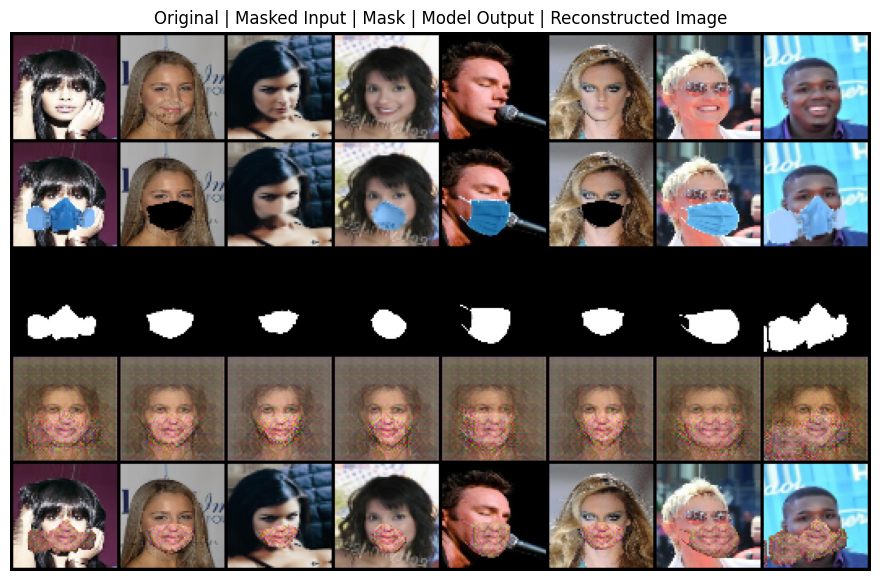

Visualization saved: training_runs/run_1/visualizations/epoch_010.png

Epoch 11/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=91.0940, d_loss=0.5053, g_l1_loss=0.4922, g_adv_loss=0.6911, g_recon_loss=0.0351, g_perceptual_loss=0.0000, psnr=10.9576, ssim=0.3051]



Epoch 12/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=88.2188, d_loss=0.5051, g_l1_loss=0.4858, g_adv_loss=0.6913, g_recon_loss=0.0301, g_perceptual_loss=0.0000, psnr=11.0791, ssim=0.3236]


Best model saved: training_runs/run_1/best_model.pth

Epoch 13/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s, g_loss=87.1858, d_loss=0.5048, g_l1_loss=0.4835, g_adv_loss=0.6915, g_recon_loss=0.0294, g_perceptual_loss=0.0000, psnr=11.1069, ssim=0.3282]


Best model saved: training_runs/run_1/best_model.pth

Epoch 14/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.44it/s, g_loss=87.6354, d_loss=0.5047, g_l1_loss=0.4851, g_adv_loss=0.6916, g_recon_loss=0.0299, g_perceptual_loss=0.0000, psnr=11.0771, ssim=0.3276]



Epoch 15/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.78it/s, g_loss=88.8408, d_loss=0.5044, g_l1_loss=0.4844, g_adv_loss=0.6920, g_recon_loss=0.0304, g_perceptual_loss=0.0000, psnr=11.1024, ssim=0.3268]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 16/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.46it/s, g_loss=87.1152, d_loss=0.5043, g_l1_loss=0.4831, g_adv_loss=0.6920, g_recon_loss=0.0291, g_perceptual_loss=0.0000, psnr=11.1128, ssim=0.3300]


Best model saved: training_runs/run_1/best_model.pth

Epoch 17/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.38it/s, g_loss=87.5238, d_loss=0.5042, g_l1_loss=0.4840, g_adv_loss=0.6921, g_recon_loss=0.0301, g_perceptual_loss=0.0000, psnr=11.0937, ssim=0.3299]



Epoch 18/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=91.4978, d_loss=0.5042, g_l1_loss=0.4879, g_adv_loss=0.6921, g_recon_loss=0.0339, g_perceptual_loss=0.0000, psnr=11.0265, ssim=0.3130]



Epoch 19/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.64it/s, g_loss=88.7551, d_loss=0.5040, g_l1_loss=0.4849, g_adv_loss=0.6923, g_recon_loss=0.0314, g_perceptual_loss=0.0000, psnr=11.0719, ssim=0.3223]



Epoch 20/200


Validating: 100%|██████████| 4/4 [00:03<00:00,  1.17it/s, g_loss=86.5316, d_loss=0.5040, g_l1_loss=0.4816, g_adv_loss=0.6923, g_recon_loss=0.0284, g_perceptual_loss=0.0000, psnr=11.1404, ssim=0.3389]


Best model saved: training_runs/run_1/best_model.pth
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


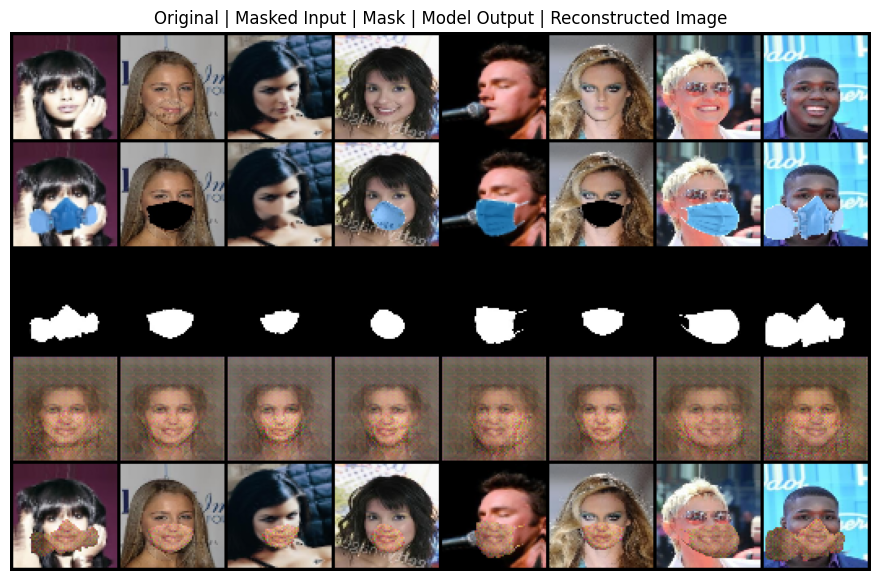

Visualization saved: training_runs/run_1/visualizations/epoch_020.png

Epoch 21/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=86.2010, d_loss=0.5040, g_l1_loss=0.4804, g_adv_loss=0.6923, g_recon_loss=0.0279, g_perceptual_loss=0.0000, psnr=11.1545, ssim=0.3387]


Best model saved: training_runs/run_1/best_model.pth

Epoch 22/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.90it/s, g_loss=86.2182, d_loss=0.5039, g_l1_loss=0.4801, g_adv_loss=0.6925, g_recon_loss=0.0283, g_perceptual_loss=0.0000, psnr=11.1614, ssim=0.3395]



Epoch 23/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.77it/s, g_loss=90.1352, d_loss=0.5038, g_l1_loss=0.4827, g_adv_loss=0.6925, g_recon_loss=0.0311, g_perceptual_loss=0.0000, psnr=11.1247, ssim=0.3296]



Epoch 24/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.85it/s, g_loss=91.0029, d_loss=0.5038, g_l1_loss=0.4848, g_adv_loss=0.6925, g_recon_loss=0.0324, g_perceptual_loss=0.0000, psnr=11.0703, ssim=0.3242]



Epoch 25/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.86it/s, g_loss=86.3623, d_loss=0.5037, g_l1_loss=0.4792, g_adv_loss=0.6926, g_recon_loss=0.0282, g_perceptual_loss=0.0000, psnr=11.1753, ssim=0.3405]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 26/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.76it/s, g_loss=86.8310, d_loss=0.5037, g_l1_loss=0.4795, g_adv_loss=0.6927, g_recon_loss=0.0286, g_perceptual_loss=0.0000, psnr=11.1536, ssim=0.3409]



Epoch 27/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.55it/s, g_loss=85.9585, d_loss=0.5037, g_l1_loss=0.4790, g_adv_loss=0.6927, g_recon_loss=0.0282, g_perceptual_loss=0.0000, psnr=11.1862, ssim=0.3431]


Best model saved: training_runs/run_1/best_model.pth

Epoch 28/200


Validating: 100%|██████████| 4/4 [00:03<00:00,  1.03it/s, g_loss=86.1975, d_loss=0.5036, g_l1_loss=0.4775, g_adv_loss=0.6927, g_recon_loss=0.0274, g_perceptual_loss=0.0000, psnr=11.2032, ssim=0.3461]



Epoch 29/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=85.9734, d_loss=0.5036, g_l1_loss=0.4782, g_adv_loss=0.6927, g_recon_loss=0.0274, g_perceptual_loss=0.0000, psnr=11.1946, ssim=0.3456]



Epoch 30/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=88.9787, d_loss=0.5036, g_l1_loss=0.4818, g_adv_loss=0.6928, g_recon_loss=0.0313, g_perceptual_loss=0.0000, psnr=11.1298, ssim=0.3303]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


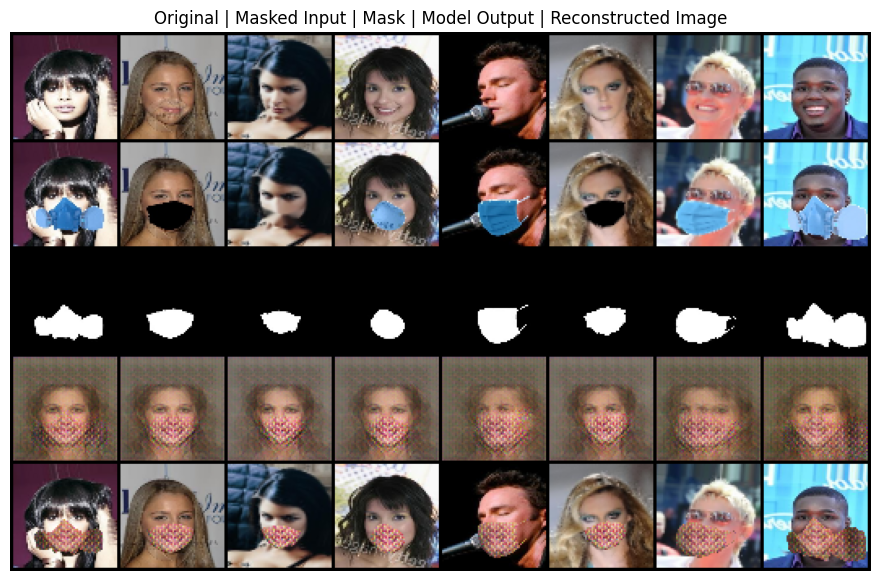

Visualization saved: training_runs/run_1/visualizations/epoch_030.png

Epoch 31/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.81it/s, g_loss=85.7049, d_loss=0.5036, g_l1_loss=0.4783, g_adv_loss=0.6928, g_recon_loss=0.0277, g_perceptual_loss=0.0000, psnr=11.1874, ssim=0.3477]


Best model saved: training_runs/run_1/best_model.pth

Epoch 32/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.03it/s, g_loss=85.6295, d_loss=0.5036, g_l1_loss=0.4782, g_adv_loss=0.6928, g_recon_loss=0.0277, g_perceptual_loss=0.0000, psnr=11.2222, ssim=0.3473]


Best model saved: training_runs/run_1/best_model.pth

Epoch 33/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s, g_loss=87.2598, d_loss=0.5035, g_l1_loss=0.4797, g_adv_loss=0.6928, g_recon_loss=0.0292, g_perceptual_loss=0.0000, psnr=11.1486, ssim=0.3371]



Epoch 34/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=88.3475, d_loss=0.5035, g_l1_loss=0.4827, g_adv_loss=0.6928, g_recon_loss=0.0305, g_perceptual_loss=0.0000, psnr=11.1144, ssim=0.3309]



Epoch 35/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=85.2049, d_loss=0.5035, g_l1_loss=0.4759, g_adv_loss=0.6929, g_recon_loss=0.0271, g_perceptual_loss=0.0000, psnr=11.2279, ssim=0.3511]


Best model saved: training_runs/run_1/best_model.pth
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 36/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=85.6945, d_loss=0.5035, g_l1_loss=0.4767, g_adv_loss=0.6929, g_recon_loss=0.0274, g_perceptual_loss=0.0000, psnr=11.2032, ssim=0.3475]



Epoch 37/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=85.4628, d_loss=0.5035, g_l1_loss=0.4773, g_adv_loss=0.6929, g_recon_loss=0.0273, g_perceptual_loss=0.0000, psnr=11.2080, ssim=0.3480]



Epoch 38/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s, g_loss=85.1667, d_loss=0.5034, g_l1_loss=0.4759, g_adv_loss=0.6929, g_recon_loss=0.0269, g_perceptual_loss=0.0000, psnr=11.2240, ssim=0.3514]


Best model saved: training_runs/run_1/best_model.pth

Epoch 39/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.63it/s, g_loss=85.8924, d_loss=0.5034, g_l1_loss=0.4780, g_adv_loss=0.6929, g_recon_loss=0.0276, g_perceptual_loss=0.0000, psnr=11.1916, ssim=0.3459]



Epoch 40/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=85.7590, d_loss=0.5035, g_l1_loss=0.4786, g_adv_loss=0.6928, g_recon_loss=0.0274, g_perceptual_loss=0.0000, psnr=11.1958, ssim=0.3482]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


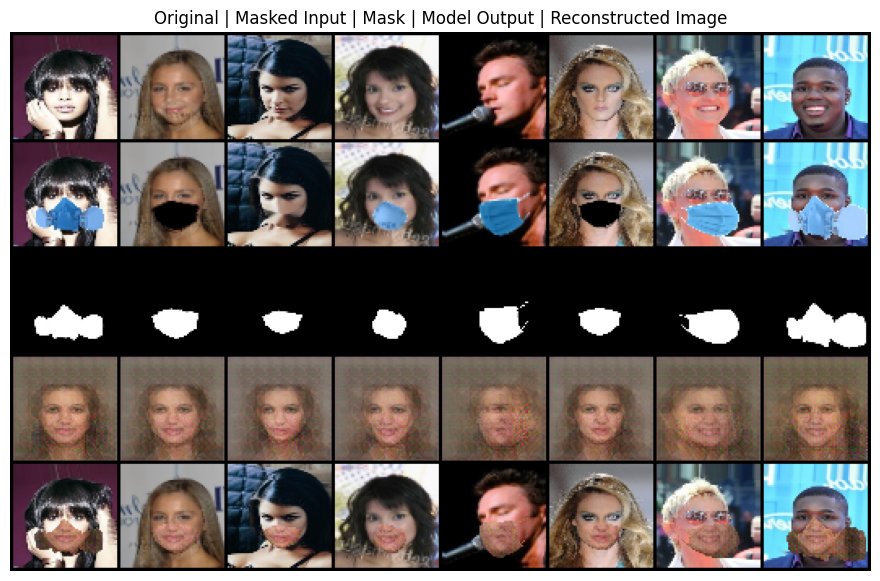

Visualization saved: training_runs/run_1/visualizations/epoch_040.png

Epoch 41/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=85.2739, d_loss=0.5034, g_l1_loss=0.4768, g_adv_loss=0.6929, g_recon_loss=0.0275, g_perceptual_loss=0.0000, psnr=11.2460, ssim=0.3506]



Epoch 42/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=85.6658, d_loss=0.5034, g_l1_loss=0.4763, g_adv_loss=0.6929, g_recon_loss=0.0273, g_perceptual_loss=0.0000, psnr=11.2200, ssim=0.3479]



Epoch 43/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=85.9862, d_loss=0.5034, g_l1_loss=0.4795, g_adv_loss=0.6929, g_recon_loss=0.0282, g_perceptual_loss=0.0000, psnr=11.2055, ssim=0.3475]



Epoch 44/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=85.7078, d_loss=0.5034, g_l1_loss=0.4771, g_adv_loss=0.6930, g_recon_loss=0.0282, g_perceptual_loss=0.0000, psnr=11.1967, ssim=0.3464]



Epoch 45/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=85.1697, d_loss=0.5034, g_l1_loss=0.4757, g_adv_loss=0.6930, g_recon_loss=0.0268, g_perceptual_loss=0.0000, psnr=11.2195, ssim=0.3525]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 46/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=88.6577, d_loss=0.5034, g_l1_loss=0.4777, g_adv_loss=0.6930, g_recon_loss=0.0287, g_perceptual_loss=0.0000, psnr=11.2044, ssim=0.3452]



Epoch 47/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=85.1847, d_loss=0.5034, g_l1_loss=0.4747, g_adv_loss=0.6930, g_recon_loss=0.0270, g_perceptual_loss=0.0000, psnr=11.2406, ssim=0.3517]



Epoch 48/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.88it/s, g_loss=85.8764, d_loss=0.5034, g_l1_loss=0.4759, g_adv_loss=0.6930, g_recon_loss=0.0273, g_perceptual_loss=0.0000, psnr=11.2349, ssim=0.3504]



Epoch 49/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=85.0102, d_loss=0.5034, g_l1_loss=0.4748, g_adv_loss=0.6930, g_recon_loss=0.0271, g_perceptual_loss=0.0000, psnr=11.2411, ssim=0.3520]


Best model saved: training_runs/run_1/best_model.pth

Epoch 50/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=84.7417, d_loss=0.5033, g_l1_loss=0.4739, g_adv_loss=0.6930, g_recon_loss=0.0266, g_perceptual_loss=0.0000, psnr=11.2606, ssim=0.3545]


Best model saved: training_runs/run_1/best_model.pth
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


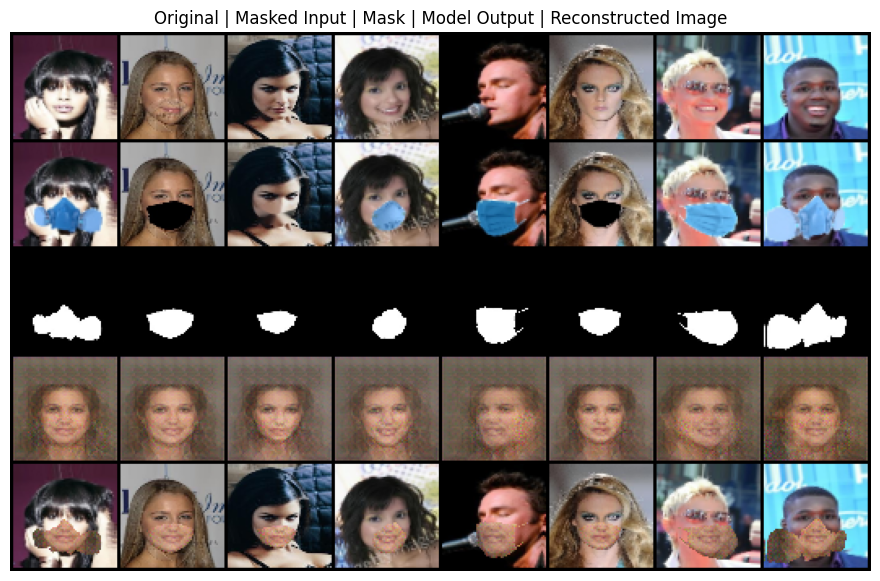

Visualization saved: training_runs/run_1/visualizations/epoch_050.png

Epoch 51/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s, g_loss=86.8544, d_loss=0.5033, g_l1_loss=0.4777, g_adv_loss=0.6930, g_recon_loss=0.0290, g_perceptual_loss=0.0000, psnr=11.2027, ssim=0.3411]



Epoch 52/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s, g_loss=85.0482, d_loss=0.5033, g_l1_loss=0.4754, g_adv_loss=0.6930, g_recon_loss=0.0268, g_perceptual_loss=0.0000, psnr=11.2410, ssim=0.3524]



Epoch 53/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.82it/s, g_loss=85.0793, d_loss=0.5033, g_l1_loss=0.4756, g_adv_loss=0.6930, g_recon_loss=0.0271, g_perceptual_loss=0.0000, psnr=11.2352, ssim=0.3519]



Epoch 54/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=84.8757, d_loss=0.5033, g_l1_loss=0.4743, g_adv_loss=0.6930, g_recon_loss=0.0268, g_perceptual_loss=0.0000, psnr=11.2542, ssim=0.3547]



Epoch 55/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=91.2101, d_loss=0.5033, g_l1_loss=0.4785, g_adv_loss=0.6930, g_recon_loss=0.0305, g_perceptual_loss=0.0000, psnr=11.1865, ssim=0.3427]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 56/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=84.8912, d_loss=0.5033, g_l1_loss=0.4740, g_adv_loss=0.6930, g_recon_loss=0.0265, g_perceptual_loss=0.0000, psnr=11.2605, ssim=0.3549]



Epoch 57/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.90it/s, g_loss=85.2280, d_loss=0.5033, g_l1_loss=0.4753, g_adv_loss=0.6930, g_recon_loss=0.0271, g_perceptual_loss=0.0000, psnr=11.2354, ssim=0.3511]



Epoch 58/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.79it/s, g_loss=84.9967, d_loss=0.5033, g_l1_loss=0.4740, g_adv_loss=0.6930, g_recon_loss=0.0267, g_perceptual_loss=0.0000, psnr=11.2494, ssim=0.3545]



Epoch 59/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.82it/s, g_loss=85.1195, d_loss=0.5033, g_l1_loss=0.4750, g_adv_loss=0.6930, g_recon_loss=0.0271, g_perceptual_loss=0.0000, psnr=11.2364, ssim=0.3545]



Epoch 60/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=85.2149, d_loss=0.5033, g_l1_loss=0.4746, g_adv_loss=0.6930, g_recon_loss=0.0277, g_perceptual_loss=0.0000, psnr=11.2372, ssim=0.3515]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


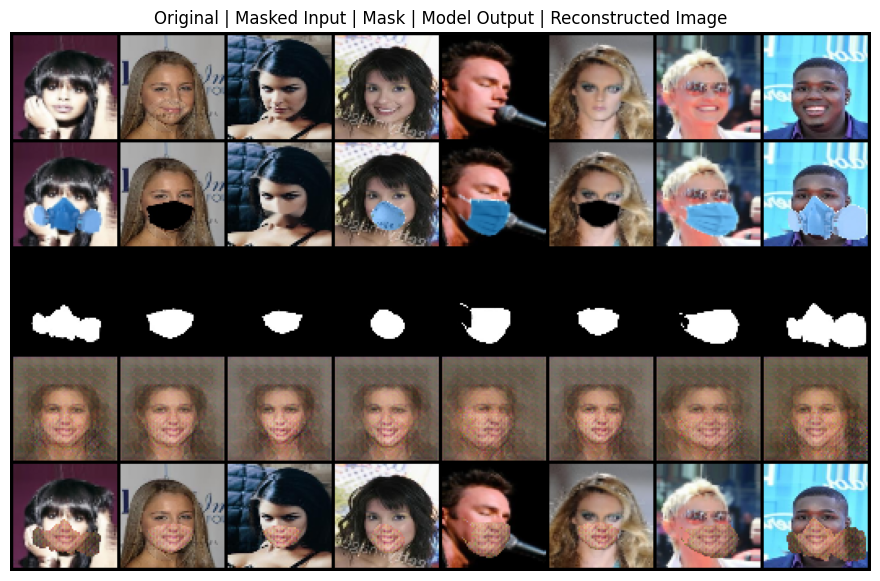

Visualization saved: training_runs/run_1/visualizations/epoch_060.png

Epoch 61/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s, g_loss=85.0149, d_loss=0.5033, g_l1_loss=0.4756, g_adv_loss=0.6930, g_recon_loss=0.0276, g_perceptual_loss=0.0000, psnr=11.2612, ssim=0.3560]



Epoch 62/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=85.2492, d_loss=0.5033, g_l1_loss=0.4744, g_adv_loss=0.6930, g_recon_loss=0.0267, g_perceptual_loss=0.0000, psnr=11.2430, ssim=0.3536]



Epoch 63/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.79it/s, g_loss=84.7896, d_loss=0.5033, g_l1_loss=0.4744, g_adv_loss=0.6930, g_recon_loss=0.0272, g_perceptual_loss=0.0000, psnr=11.2553, ssim=0.3565]



Epoch 64/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s, g_loss=88.3157, d_loss=0.5033, g_l1_loss=0.4765, g_adv_loss=0.6931, g_recon_loss=0.0291, g_perceptual_loss=0.0000, psnr=11.2004, ssim=0.3444]



Epoch 65/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s, g_loss=85.0132, d_loss=0.5033, g_l1_loss=0.4753, g_adv_loss=0.6930, g_recon_loss=0.0275, g_perceptual_loss=0.0000, psnr=11.2389, ssim=0.3533]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 66/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=85.3905, d_loss=0.5033, g_l1_loss=0.4763, g_adv_loss=0.6930, g_recon_loss=0.0272, g_perceptual_loss=0.0000, psnr=11.2045, ssim=0.3549]



Epoch 67/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s, g_loss=84.5972, d_loss=0.5033, g_l1_loss=0.4734, g_adv_loss=0.6931, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.2729, ssim=0.3566]


Best model saved: training_runs/run_1/best_model.pth

Epoch 68/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=84.4273, d_loss=0.5033, g_l1_loss=0.4733, g_adv_loss=0.6931, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.2638, ssim=0.3567]


Best model saved: training_runs/run_1/best_model.pth

Epoch 69/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=86.3177, d_loss=0.5033, g_l1_loss=0.4752, g_adv_loss=0.6931, g_recon_loss=0.0279, g_perceptual_loss=0.0000, psnr=11.2325, ssim=0.3486]



Epoch 70/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=87.0056, d_loss=0.5033, g_l1_loss=0.4733, g_adv_loss=0.6931, g_recon_loss=0.0273, g_perceptual_loss=0.0000, psnr=11.2626, ssim=0.3520]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


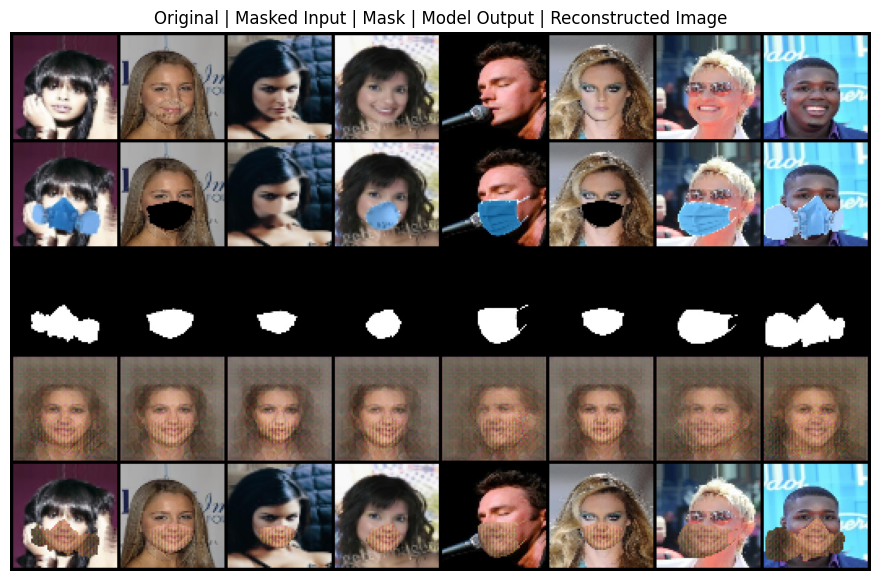

Visualization saved: training_runs/run_1/visualizations/epoch_070.png

Epoch 71/200


Validating: 100%|██████████| 4/4 [00:03<00:00,  1.02it/s, g_loss=84.7743, d_loss=0.5033, g_l1_loss=0.4743, g_adv_loss=0.6931, g_recon_loss=0.0266, g_perceptual_loss=0.0000, psnr=11.2434, ssim=0.3567]



Epoch 72/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.87it/s, g_loss=85.2388, d_loss=0.5033, g_l1_loss=0.4727, g_adv_loss=0.6931, g_recon_loss=0.0268, g_perceptual_loss=0.0000, psnr=11.2663, ssim=0.3579]



Epoch 73/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s, g_loss=84.6660, d_loss=0.5033, g_l1_loss=0.4727, g_adv_loss=0.6931, g_recon_loss=0.0266, g_perceptual_loss=0.0000, psnr=11.2764, ssim=0.3565]



Epoch 74/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=84.5004, d_loss=0.5033, g_l1_loss=0.4734, g_adv_loss=0.6931, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.2593, ssim=0.3573]



Epoch 75/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.90it/s, g_loss=84.6259, d_loss=0.5033, g_l1_loss=0.4737, g_adv_loss=0.6931, g_recon_loss=0.0266, g_perceptual_loss=0.0000, psnr=11.2517, ssim=0.3544]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 76/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.93it/s, g_loss=84.5051, d_loss=0.5033, g_l1_loss=0.4725, g_adv_loss=0.6931, g_recon_loss=0.0262, g_perceptual_loss=0.0000, psnr=11.2785, ssim=0.3567]



Epoch 77/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=84.4395, d_loss=0.5033, g_l1_loss=0.4728, g_adv_loss=0.6931, g_recon_loss=0.0262, g_perceptual_loss=0.0000, psnr=11.2666, ssim=0.3582]



Epoch 78/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.88it/s, g_loss=84.4752, d_loss=0.5033, g_l1_loss=0.4726, g_adv_loss=0.6931, g_recon_loss=0.0262, g_perceptual_loss=0.0000, psnr=11.2760, ssim=0.3588]



Epoch 79/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s, g_loss=84.6107, d_loss=0.5033, g_l1_loss=0.4724, g_adv_loss=0.6931, g_recon_loss=0.0266, g_perceptual_loss=0.0000, psnr=11.2629, ssim=0.3552]



Epoch 80/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=84.8231, d_loss=0.5033, g_l1_loss=0.4742, g_adv_loss=0.6931, g_recon_loss=0.0270, g_perceptual_loss=0.0000, psnr=11.2518, ssim=0.3555]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


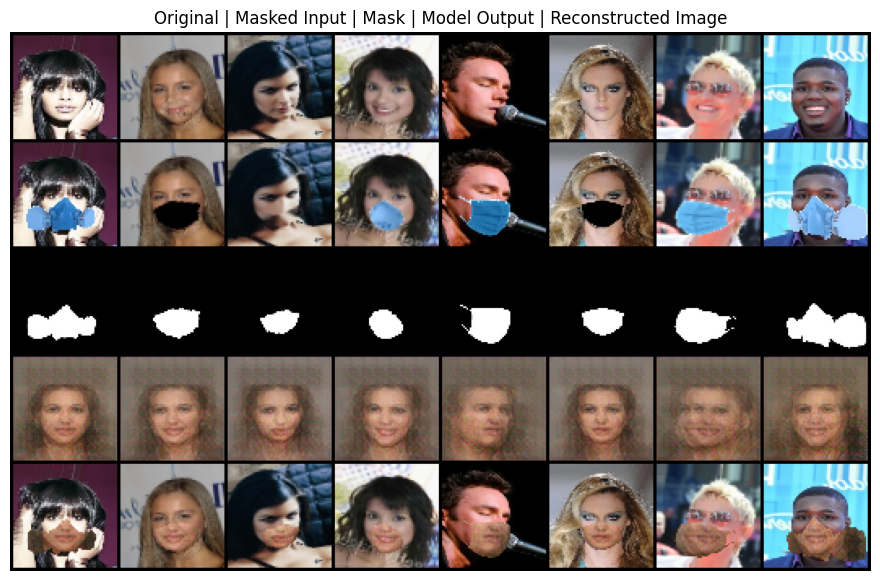

Visualization saved: training_runs/run_1/visualizations/epoch_080.png

Epoch 81/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.62it/s, g_loss=84.5102, d_loss=0.5033, g_l1_loss=0.4726, g_adv_loss=0.6931, g_recon_loss=0.0262, g_perceptual_loss=0.0000, psnr=11.2740, ssim=0.3601]



Epoch 82/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=84.7073, d_loss=0.5033, g_l1_loss=0.4736, g_adv_loss=0.6931, g_recon_loss=0.0272, g_perceptual_loss=0.0000, psnr=11.2758, ssim=0.3569]



Epoch 83/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s, g_loss=84.4821, d_loss=0.5033, g_l1_loss=0.4729, g_adv_loss=0.6931, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.2695, ssim=0.3575]



Epoch 84/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=84.4494, d_loss=0.5033, g_l1_loss=0.4725, g_adv_loss=0.6931, g_recon_loss=0.0262, g_perceptual_loss=0.0000, psnr=11.2801, ssim=0.3591]



Epoch 85/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=84.4127, d_loss=0.5033, g_l1_loss=0.4721, g_adv_loss=0.6931, g_recon_loss=0.0266, g_perceptual_loss=0.0000, psnr=11.2904, ssim=0.3598]


Best model saved: training_runs/run_1/best_model.pth
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 86/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=84.5232, d_loss=0.5033, g_l1_loss=0.4731, g_adv_loss=0.6931, g_recon_loss=0.0265, g_perceptual_loss=0.0000, psnr=11.2463, ssim=0.3602]



Epoch 87/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.71it/s, g_loss=84.6580, d_loss=0.5033, g_l1_loss=0.4730, g_adv_loss=0.6931, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.2828, ssim=0.3557]



Epoch 88/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.86it/s, g_loss=85.5203, d_loss=0.5033, g_l1_loss=0.4739, g_adv_loss=0.6931, g_recon_loss=0.0272, g_perceptual_loss=0.0000, psnr=11.2431, ssim=0.3573]



Epoch 89/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.74it/s, g_loss=84.2991, d_loss=0.5032, g_l1_loss=0.4726, g_adv_loss=0.6931, g_recon_loss=0.0267, g_perceptual_loss=0.0000, psnr=11.2683, ssim=0.3588]


Best model saved: training_runs/run_1/best_model.pth

Epoch 90/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.71it/s, g_loss=84.5482, d_loss=0.5032, g_l1_loss=0.4734, g_adv_loss=0.6931, g_recon_loss=0.0265, g_perceptual_loss=0.0000, psnr=11.2456, ssim=0.3577]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


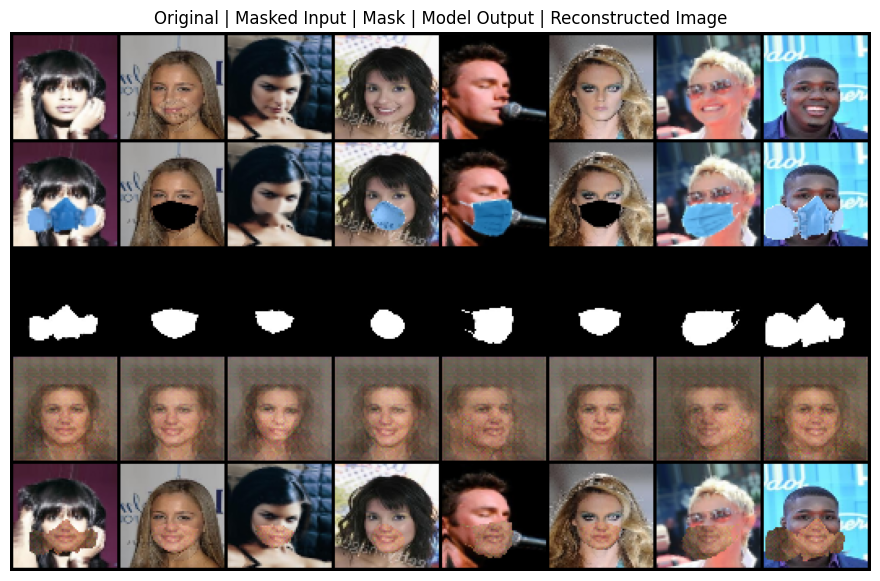

Visualization saved: training_runs/run_1/visualizations/epoch_090.png

Epoch 91/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=84.3902, d_loss=0.5032, g_l1_loss=0.4719, g_adv_loss=0.6931, g_recon_loss=0.0262, g_perceptual_loss=0.0000, psnr=11.2810, ssim=0.3561]



Epoch 92/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=84.4816, d_loss=0.5032, g_l1_loss=0.4730, g_adv_loss=0.6931, g_recon_loss=0.0262, g_perceptual_loss=0.0000, psnr=11.2625, ssim=0.3595]



Epoch 93/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=84.3522, d_loss=0.5032, g_l1_loss=0.4723, g_adv_loss=0.6931, g_recon_loss=0.0262, g_perceptual_loss=0.0000, psnr=11.2617, ssim=0.3602]



Epoch 94/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=84.5323, d_loss=0.5032, g_l1_loss=0.4726, g_adv_loss=0.6931, g_recon_loss=0.0266, g_perceptual_loss=0.0000, psnr=11.2546, ssim=0.3599]



Epoch 95/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s, g_loss=84.7768, d_loss=0.5032, g_l1_loss=0.4723, g_adv_loss=0.6931, g_recon_loss=0.0262, g_perceptual_loss=0.0000, psnr=11.2832, ssim=0.3589]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 96/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s, g_loss=84.3509, d_loss=0.5032, g_l1_loss=0.4724, g_adv_loss=0.6931, g_recon_loss=0.0263, g_perceptual_loss=0.0000, psnr=11.2674, ssim=0.3598]



Epoch 97/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s, g_loss=84.7997, d_loss=0.5032, g_l1_loss=0.4732, g_adv_loss=0.6931, g_recon_loss=0.0271, g_perceptual_loss=0.0000, psnr=11.2602, ssim=0.3560]



Epoch 98/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.87it/s, g_loss=84.5373, d_loss=0.5032, g_l1_loss=0.4717, g_adv_loss=0.6931, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.2819, ssim=0.3588]



Epoch 99/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.85it/s, g_loss=84.1472, d_loss=0.5032, g_l1_loss=0.4706, g_adv_loss=0.6931, g_recon_loss=0.0258, g_perceptual_loss=0.0000, psnr=11.2996, ssim=0.3614]


Best model saved: training_runs/run_1/best_model.pth

Epoch 100/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.93it/s, g_loss=84.9483, d_loss=0.5032, g_l1_loss=0.4742, g_adv_loss=0.6931, g_recon_loss=0.0270, g_perceptual_loss=0.0000, psnr=11.2516, ssim=0.3564]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


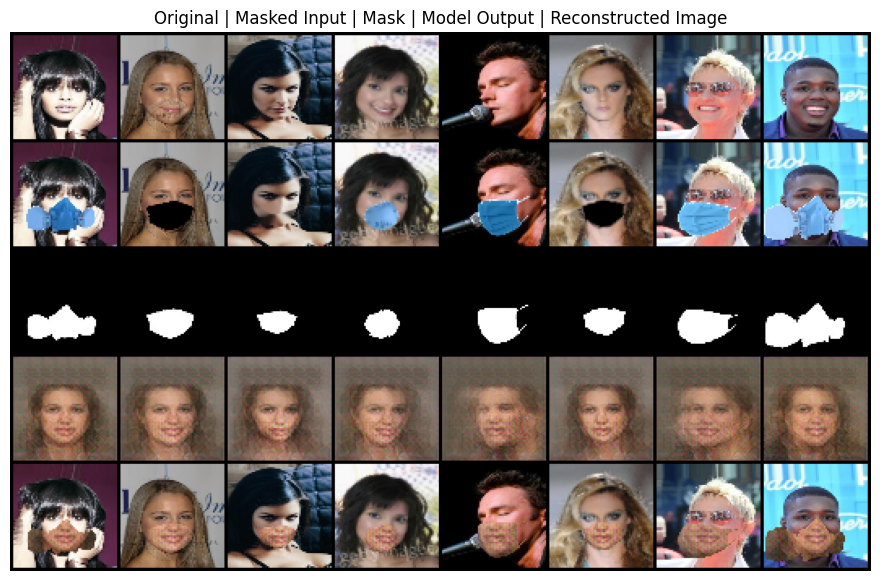

Visualization saved: training_runs/run_1/visualizations/epoch_100.png

Epoch 101/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=86.5136, d_loss=0.5032, g_l1_loss=0.4737, g_adv_loss=0.6931, g_recon_loss=0.0281, g_perceptual_loss=0.0000, psnr=11.2715, ssim=0.3521]



Epoch 102/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.93it/s, g_loss=84.2823, d_loss=0.5032, g_l1_loss=0.4720, g_adv_loss=0.6931, g_recon_loss=0.0262, g_perceptual_loss=0.0000, psnr=11.2870, ssim=0.3579]



Epoch 103/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=84.3657, d_loss=0.5032, g_l1_loss=0.4713, g_adv_loss=0.6931, g_recon_loss=0.0261, g_perceptual_loss=0.0000, psnr=11.2988, ssim=0.3612]



Epoch 104/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.80it/s, g_loss=84.2313, d_loss=0.5032, g_l1_loss=0.4720, g_adv_loss=0.6931, g_recon_loss=0.0260, g_perceptual_loss=0.0000, psnr=11.2812, ssim=0.3609]



Epoch 105/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=84.5478, d_loss=0.5032, g_l1_loss=0.4724, g_adv_loss=0.6931, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.2466, ssim=0.3596]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 106/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.87it/s, g_loss=84.5099, d_loss=0.5032, g_l1_loss=0.4722, g_adv_loss=0.6931, g_recon_loss=0.0265, g_perceptual_loss=0.0000, psnr=11.2911, ssim=0.3592]



Epoch 107/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.93it/s, g_loss=84.3544, d_loss=0.5032, g_l1_loss=0.4725, g_adv_loss=0.6931, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.2584, ssim=0.3609]



Epoch 108/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=84.1476, d_loss=0.5032, g_l1_loss=0.4703, g_adv_loss=0.6931, g_recon_loss=0.0260, g_perceptual_loss=0.0000, psnr=11.3034, ssim=0.3604]



Epoch 109/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.85it/s, g_loss=84.5052, d_loss=0.5032, g_l1_loss=0.4714, g_adv_loss=0.6931, g_recon_loss=0.0268, g_perceptual_loss=0.0000, psnr=11.2733, ssim=0.3579]



Epoch 110/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s, g_loss=84.3492, d_loss=0.5032, g_l1_loss=0.4711, g_adv_loss=0.6931, g_recon_loss=0.0259, g_perceptual_loss=0.0000, psnr=11.2602, ssim=0.3601]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


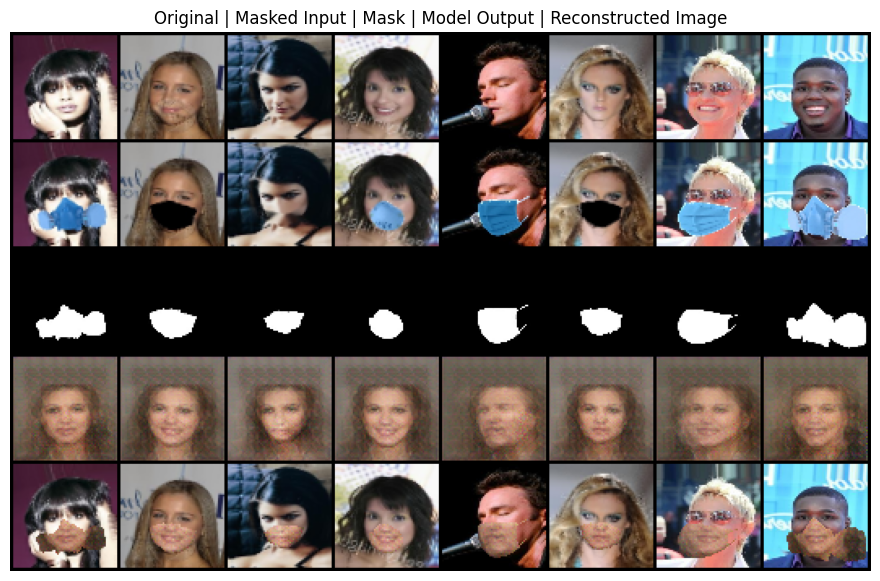

Visualization saved: training_runs/run_1/visualizations/epoch_110.png

Epoch 111/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s, g_loss=84.9059, d_loss=0.5032, g_l1_loss=0.4735, g_adv_loss=0.6931, g_recon_loss=0.0279, g_perceptual_loss=0.0000, psnr=11.2699, ssim=0.3554]



Epoch 112/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s, g_loss=84.8844, d_loss=0.5032, g_l1_loss=0.4758, g_adv_loss=0.6931, g_recon_loss=0.0268, g_perceptual_loss=0.0000, psnr=11.2195, ssim=0.3592]



Epoch 113/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=84.2804, d_loss=0.5032, g_l1_loss=0.4718, g_adv_loss=0.6931, g_recon_loss=0.0260, g_perceptual_loss=0.0000, psnr=11.2713, ssim=0.3601]



Epoch 114/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=84.3844, d_loss=0.5032, g_l1_loss=0.4721, g_adv_loss=0.6931, g_recon_loss=0.0263, g_perceptual_loss=0.0000, psnr=11.2672, ssim=0.3596]



Epoch 115/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=84.2056, d_loss=0.5032, g_l1_loss=0.4708, g_adv_loss=0.6931, g_recon_loss=0.0259, g_perceptual_loss=0.0000, psnr=11.2790, ssim=0.3604]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 116/200


Validating: 100%|██████████| 4/4 [00:03<00:00,  1.30it/s, g_loss=84.2230, d_loss=0.5032, g_l1_loss=0.4708, g_adv_loss=0.6931, g_recon_loss=0.0261, g_perceptual_loss=0.0000, psnr=11.3065, ssim=0.3600]



Epoch 117/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.00it/s, g_loss=84.8262, d_loss=0.5032, g_l1_loss=0.4741, g_adv_loss=0.6931, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.2126, ssim=0.3587]



Epoch 118/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.93it/s, g_loss=84.0256, d_loss=0.5032, g_l1_loss=0.4698, g_adv_loss=0.6931, g_recon_loss=0.0257, g_perceptual_loss=0.0000, psnr=11.3171, ssim=0.3636]


Best model saved: training_runs/run_1/best_model.pth

Epoch 119/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s, g_loss=84.4927, d_loss=0.5032, g_l1_loss=0.4721, g_adv_loss=0.6931, g_recon_loss=0.0259, g_perceptual_loss=0.0000, psnr=11.2498, ssim=0.3612]



Epoch 120/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=85.5091, d_loss=0.5032, g_l1_loss=0.4753, g_adv_loss=0.6931, g_recon_loss=0.0280, g_perceptual_loss=0.0000, psnr=11.2456, ssim=0.3530]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


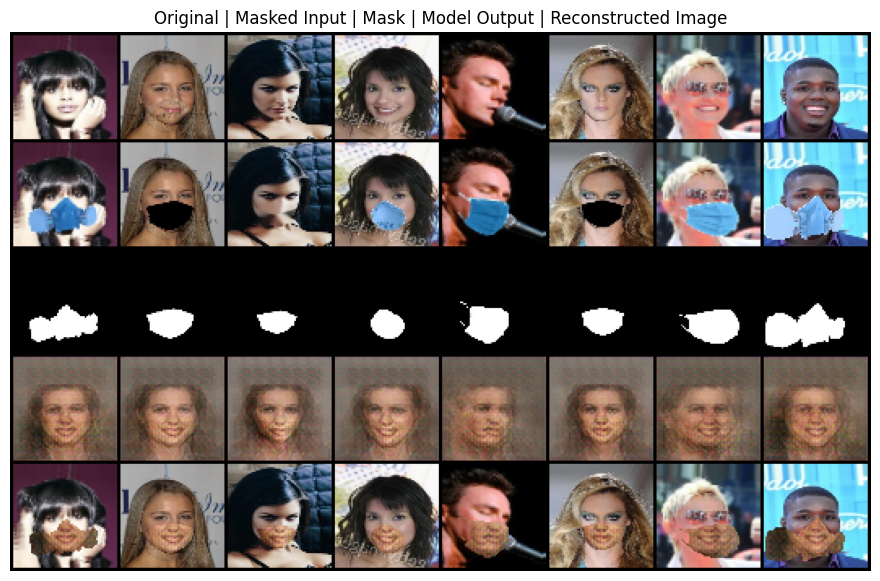

Visualization saved: training_runs/run_1/visualizations/epoch_120.png

Epoch 121/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=83.9887, d_loss=0.5032, g_l1_loss=0.4692, g_adv_loss=0.6931, g_recon_loss=0.0259, g_perceptual_loss=0.0000, psnr=11.3137, ssim=0.3611]


Best model saved: training_runs/run_1/best_model.pth

Epoch 122/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=84.7518, d_loss=0.5032, g_l1_loss=0.4738, g_adv_loss=0.6931, g_recon_loss=0.0270, g_perceptual_loss=0.0000, psnr=11.2303, ssim=0.3591]



Epoch 123/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s, g_loss=84.6761, d_loss=0.5032, g_l1_loss=0.4732, g_adv_loss=0.6931, g_recon_loss=0.0261, g_perceptual_loss=0.0000, psnr=11.2209, ssim=0.3589]



Epoch 124/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s, g_loss=84.5943, d_loss=0.5035, g_l1_loss=0.4729, g_adv_loss=0.6927, g_recon_loss=0.0277, g_perceptual_loss=0.0000, psnr=11.2965, ssim=0.3606]



Epoch 125/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=84.1910, d_loss=0.5034, g_l1_loss=0.4701, g_adv_loss=0.6929, g_recon_loss=0.0260, g_perceptual_loss=0.0000, psnr=11.2988, ssim=0.3592]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 126/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  2.00it/s, g_loss=83.7387, d_loss=0.5033, g_l1_loss=0.4686, g_adv_loss=0.6930, g_recon_loss=0.0257, g_perceptual_loss=0.0000, psnr=11.3352, ssim=0.3611]


Best model saved: training_runs/run_1/best_model.pth

Epoch 127/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s, g_loss=84.1596, d_loss=0.5033, g_l1_loss=0.4690, g_adv_loss=0.6929, g_recon_loss=0.0257, g_perceptual_loss=0.0000, psnr=11.3160, ssim=0.3589]



Epoch 128/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.90it/s, g_loss=83.7912, d_loss=0.5033, g_l1_loss=0.4685, g_adv_loss=0.6930, g_recon_loss=0.0253, g_perceptual_loss=0.0000, psnr=11.3071, ssim=0.3630]



Epoch 129/200


Validating: 100%|██████████| 4/4 [00:04<00:00,  1.01s/it, g_loss=85.0485, d_loss=0.5033, g_l1_loss=0.4723, g_adv_loss=0.6930, g_recon_loss=0.0272, g_perceptual_loss=0.0000, psnr=11.2916, ssim=0.3553]



Epoch 130/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.72it/s, g_loss=84.9690, d_loss=0.5034, g_l1_loss=0.4748, g_adv_loss=0.6928, g_recon_loss=0.0276, g_perceptual_loss=0.0000, psnr=11.2109, ssim=0.3576]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


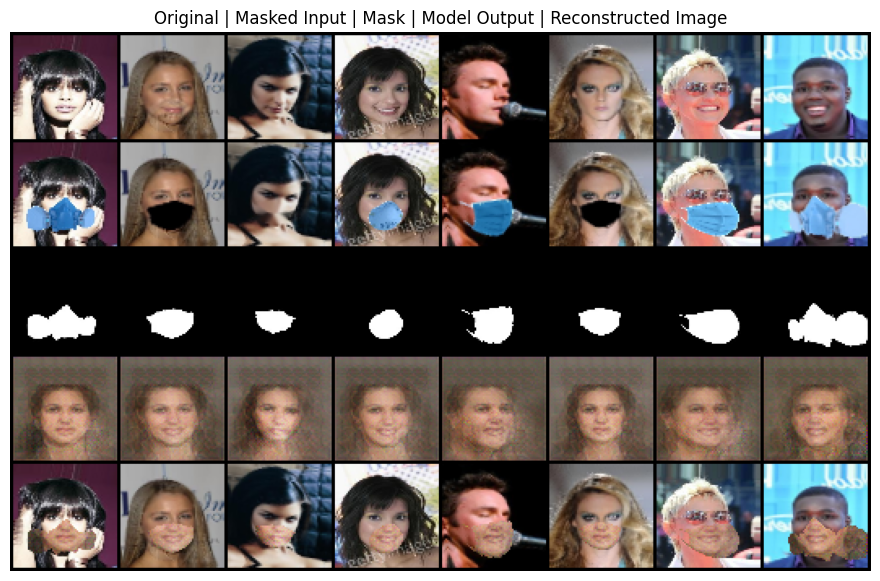

Visualization saved: training_runs/run_1/visualizations/epoch_130.png

Epoch 131/200


Validating: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s, g_loss=84.7108, d_loss=0.5033, g_l1_loss=0.4713, g_adv_loss=0.6929, g_recon_loss=0.0263, g_perceptual_loss=0.0000, psnr=11.3013, ssim=0.3610]



Epoch 132/200


Validating: 100%|██████████| 4/4 [00:03<00:00,  1.26it/s, g_loss=86.2499, d_loss=0.5033, g_l1_loss=0.4721, g_adv_loss=0.6931, g_recon_loss=0.0291, g_perceptual_loss=0.0000, psnr=11.2591, ssim=0.3501]



Epoch 133/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s, g_loss=84.4002, d_loss=0.5033, g_l1_loss=0.4702, g_adv_loss=0.6929, g_recon_loss=0.0249, g_perceptual_loss=0.0000, psnr=11.2833, ssim=0.3603]



Epoch 134/200


Validating: 100%|██████████| 4/4 [00:04<00:00,  1.08s/it, g_loss=84.1951, d_loss=0.5033, g_l1_loss=0.4678, g_adv_loss=0.6930, g_recon_loss=0.0259, g_perceptual_loss=0.0000, psnr=11.3465, ssim=0.3566]



Epoch 135/200


Validating: 100%|██████████| 4/4 [00:03<00:00,  1.26it/s, g_loss=87.1641, d_loss=0.5033, g_l1_loss=0.4677, g_adv_loss=0.6931, g_recon_loss=0.0276, g_perceptual_loss=0.0000, psnr=11.3625, ssim=0.3530]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 136/200


Validating: 100%|██████████| 4/4 [00:04<00:00,  1.11s/it, g_loss=86.2238, d_loss=0.5034, g_l1_loss=0.4726, g_adv_loss=0.6928, g_recon_loss=0.0283, g_perceptual_loss=0.0000, psnr=11.2796, ssim=0.3411]



Epoch 137/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=85.3178, d_loss=0.5037, g_l1_loss=0.4644, g_adv_loss=0.6922, g_recon_loss=0.0258, g_perceptual_loss=0.0000, psnr=11.3643, ssim=0.3511]



Epoch 138/200


Validating: 100%|██████████| 4/4 [00:04<00:00,  1.08s/it, g_loss=83.3330, d_loss=0.5033, g_l1_loss=0.4571, g_adv_loss=0.6930, g_recon_loss=0.0259, g_perceptual_loss=0.0000, psnr=11.5135, ssim=0.3578]


Best model saved: training_runs/run_1/best_model.pth

Epoch 139/200


Validating: 100%|██████████| 4/4 [00:03<00:00,  1.23it/s, g_loss=83.5141, d_loss=0.5034, g_l1_loss=0.4587, g_adv_loss=0.6929, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.5244, ssim=0.3514]



Epoch 140/200


Validating: 100%|██████████| 4/4 [00:04<00:00,  1.10s/it, g_loss=85.3299, d_loss=0.5033, g_l1_loss=0.4591, g_adv_loss=0.6930, g_recon_loss=0.0285, g_perceptual_loss=0.0000, psnr=11.4898, ssim=0.3395]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


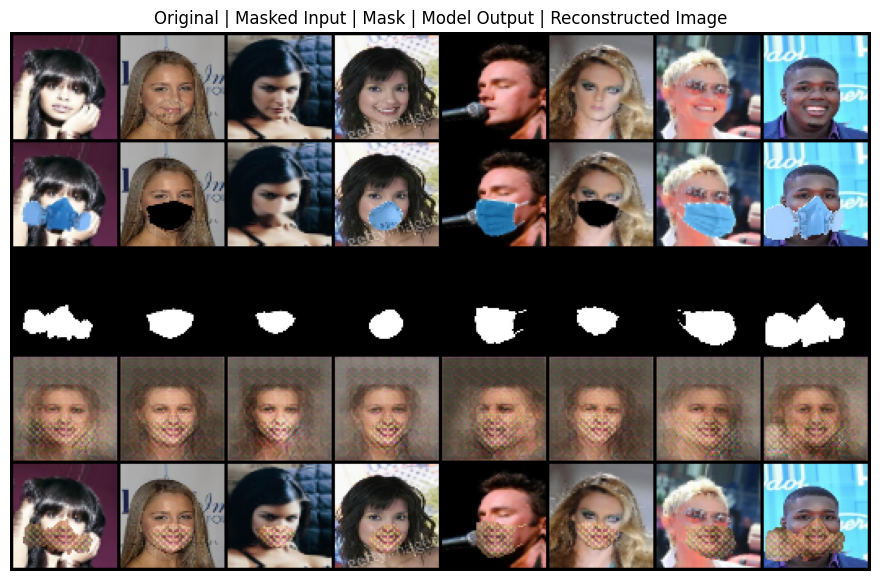

Visualization saved: training_runs/run_1/visualizations/epoch_140.png

Epoch 141/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=84.1976, d_loss=0.5033, g_l1_loss=0.4604, g_adv_loss=0.6931, g_recon_loss=0.0278, g_perceptual_loss=0.0000, psnr=11.4521, ssim=0.3486]



Epoch 142/200


Validating: 100%|██████████| 4/4 [00:03<00:00,  1.01it/s, g_loss=83.0397, d_loss=0.5033, g_l1_loss=0.4467, g_adv_loss=0.6930, g_recon_loss=0.0262, g_perceptual_loss=0.0000, psnr=11.6853, ssim=0.3429]


Best model saved: training_runs/run_1/best_model.pth

Epoch 143/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.40it/s, g_loss=81.4654, d_loss=0.5033, g_l1_loss=0.4394, g_adv_loss=0.6930, g_recon_loss=0.0254, g_perceptual_loss=0.0000, psnr=11.8083, ssim=0.3539]


Best model saved: training_runs/run_1/best_model.pth

Epoch 144/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.90it/s, g_loss=83.6038, d_loss=0.5034, g_l1_loss=0.4606, g_adv_loss=0.6929, g_recon_loss=0.0243, g_perceptual_loss=0.0000, psnr=11.3471, ssim=0.3559]



Epoch 145/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.88it/s, g_loss=81.8928, d_loss=0.5033, g_l1_loss=0.4419, g_adv_loss=0.6930, g_recon_loss=0.0244, g_perceptual_loss=0.0000, psnr=11.7650, ssim=0.3530]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 146/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=82.2954, d_loss=0.5033, g_l1_loss=0.4379, g_adv_loss=0.6931, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.7841, ssim=0.3468]



Epoch 147/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=82.5363, d_loss=0.5033, g_l1_loss=0.4358, g_adv_loss=0.6931, g_recon_loss=0.0267, g_perceptual_loss=0.0000, psnr=11.8607, ssim=0.3468]



Epoch 148/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=82.3994, d_loss=0.5033, g_l1_loss=0.4363, g_adv_loss=0.6931, g_recon_loss=0.0270, g_perceptual_loss=0.0000, psnr=11.8344, ssim=0.3461]



Epoch 149/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.93it/s, g_loss=83.5338, d_loss=0.5033, g_l1_loss=0.4428, g_adv_loss=0.6930, g_recon_loss=0.0292, g_perceptual_loss=0.0000, psnr=11.7540, ssim=0.3410]



Epoch 150/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=83.8520, d_loss=0.5038, g_l1_loss=0.4561, g_adv_loss=0.6921, g_recon_loss=0.0264, g_perceptual_loss=0.0000, psnr=11.3880, ssim=0.3429]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


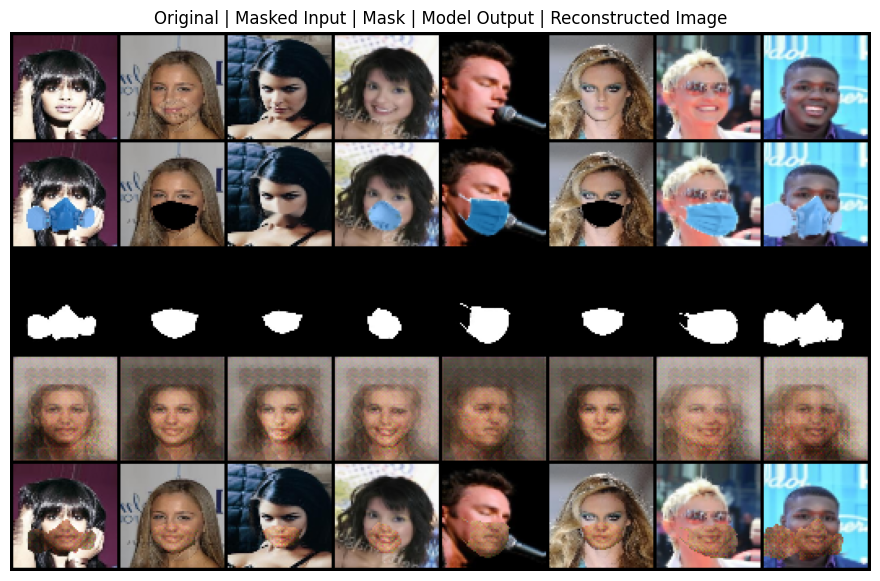

Visualization saved: training_runs/run_1/visualizations/epoch_150.png

Epoch 151/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.93it/s, g_loss=82.2614, d_loss=0.5033, g_l1_loss=0.4343, g_adv_loss=0.6931, g_recon_loss=0.0273, g_perceptual_loss=0.0000, psnr=11.8771, ssim=0.3510]



Epoch 152/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=80.2724, d_loss=0.5033, g_l1_loss=0.4264, g_adv_loss=0.6931, g_recon_loss=0.0252, g_perceptual_loss=0.0000, psnr=12.0210, ssim=0.3584]


Best model saved: training_runs/run_1/best_model.pth

Epoch 153/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.84it/s, g_loss=80.9783, d_loss=0.5033, g_l1_loss=0.4343, g_adv_loss=0.6930, g_recon_loss=0.0244, g_perceptual_loss=0.0000, psnr=11.8156, ssim=0.3599]



Epoch 154/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=80.5128, d_loss=0.5164, g_l1_loss=0.4318, g_adv_loss=0.6729, g_recon_loss=0.0240, g_perceptual_loss=0.0000, psnr=11.8452, ssim=0.3630]



Epoch 155/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.83it/s, g_loss=80.0270, d_loss=0.5036, g_l1_loss=0.4250, g_adv_loss=0.6926, g_recon_loss=0.0256, g_perceptual_loss=0.0000, psnr=12.0179, ssim=0.3601]


Best model saved: training_runs/run_1/best_model.pth
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 156/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.89it/s, g_loss=80.3112, d_loss=0.5034, g_l1_loss=0.4270, g_adv_loss=0.6929, g_recon_loss=0.0241, g_perceptual_loss=0.0000, psnr=11.9090, ssim=0.3547]



Epoch 157/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.82it/s, g_loss=79.4629, d_loss=0.5033, g_l1_loss=0.4204, g_adv_loss=0.6930, g_recon_loss=0.0240, g_perceptual_loss=0.0000, psnr=12.0506, ssim=0.3599]


Best model saved: training_runs/run_1/best_model.pth

Epoch 158/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.35it/s, g_loss=80.2700, d_loss=0.5034, g_l1_loss=0.4271, g_adv_loss=0.6929, g_recon_loss=0.0243, g_perceptual_loss=0.0000, psnr=12.0054, ssim=0.3628]



Epoch 159/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.42it/s, g_loss=79.1907, d_loss=0.5033, g_l1_loss=0.4181, g_adv_loss=0.6931, g_recon_loss=0.0248, g_perceptual_loss=0.0000, psnr=12.1605, ssim=0.3615]


Best model saved: training_runs/run_1/best_model.pth

Epoch 160/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.89it/s, g_loss=79.0405, d_loss=0.5033, g_l1_loss=0.4132, g_adv_loss=0.6930, g_recon_loss=0.0243, g_perceptual_loss=0.0000, psnr=12.2648, ssim=0.3624]


Best model saved: training_runs/run_1/best_model.pth
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


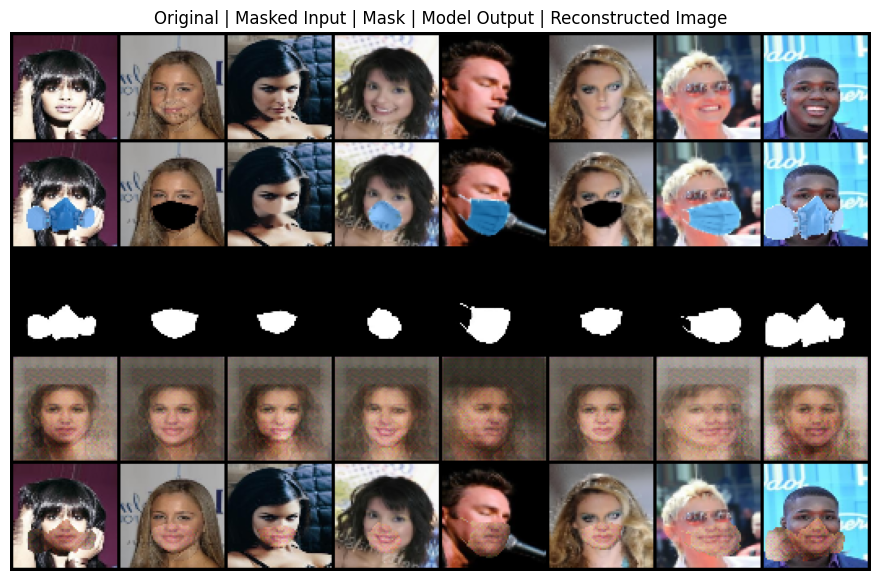

Visualization saved: training_runs/run_1/visualizations/epoch_160.png

Epoch 161/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.72it/s, g_loss=81.4529, d_loss=0.5032, g_l1_loss=0.4179, g_adv_loss=0.6931, g_recon_loss=0.0259, g_perceptual_loss=0.0000, psnr=12.2077, ssim=0.3544]



Epoch 162/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=78.7232, d_loss=0.5033, g_l1_loss=0.4132, g_adv_loss=0.6931, g_recon_loss=0.0247, g_perceptual_loss=0.0000, psnr=12.1809, ssim=0.3629]


Best model saved: training_runs/run_1/best_model.pth

Epoch 163/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.82it/s, g_loss=81.2652, d_loss=0.5033, g_l1_loss=0.4305, g_adv_loss=0.6931, g_recon_loss=0.0251, g_perceptual_loss=0.0000, psnr=11.8154, ssim=0.3574]



Epoch 164/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.90it/s, g_loss=79.1475, d_loss=0.5033, g_l1_loss=0.4157, g_adv_loss=0.6931, g_recon_loss=0.0240, g_perceptual_loss=0.0000, psnr=12.2068, ssim=0.3613]



Epoch 165/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s, g_loss=78.1847, d_loss=0.5033, g_l1_loss=0.4081, g_adv_loss=0.6931, g_recon_loss=0.0235, g_perceptual_loss=0.0000, psnr=12.3105, ssim=0.3642]


Best model saved: training_runs/run_1/best_model.pth
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 166/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.79it/s, g_loss=79.8130, d_loss=0.5033, g_l1_loss=0.4218, g_adv_loss=0.6931, g_recon_loss=0.0254, g_perceptual_loss=0.0000, psnr=11.9655, ssim=0.3665]



Epoch 167/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=82.4626, d_loss=0.5033, g_l1_loss=0.4259, g_adv_loss=0.6930, g_recon_loss=0.0295, g_perceptual_loss=0.0000, psnr=11.9425, ssim=0.3552]



Epoch 168/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s, g_loss=80.7991, d_loss=0.5033, g_l1_loss=0.4218, g_adv_loss=0.6931, g_recon_loss=0.0269, g_perceptual_loss=0.0000, psnr=12.0236, ssim=0.3611]



Epoch 169/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s, g_loss=79.5882, d_loss=0.5033, g_l1_loss=0.4211, g_adv_loss=0.6930, g_recon_loss=0.0238, g_perceptual_loss=0.0000, psnr=12.0858, ssim=0.3671]



Epoch 170/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=77.5764, d_loss=0.5032, g_l1_loss=0.4051, g_adv_loss=0.6931, g_recon_loss=0.0229, g_perceptual_loss=0.0000, psnr=12.3645, ssim=0.3670]


Best model saved: training_runs/run_1/best_model.pth
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


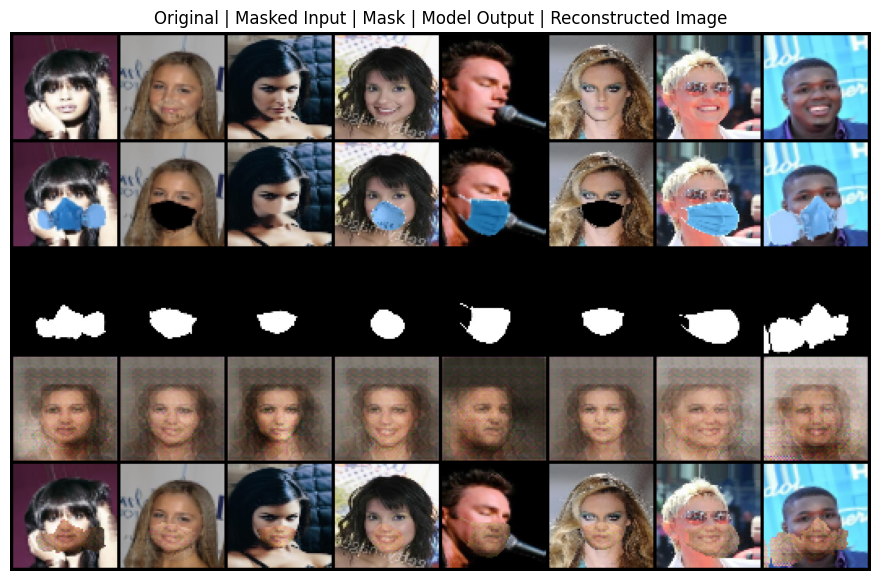

Visualization saved: training_runs/run_1/visualizations/epoch_170.png

Epoch 171/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.77it/s, g_loss=79.2263, d_loss=0.5032, g_l1_loss=0.4199, g_adv_loss=0.6931, g_recon_loss=0.0230, g_perceptual_loss=0.0000, psnr=12.0202, ssim=0.3642]



Epoch 172/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.87it/s, g_loss=78.5213, d_loss=0.5032, g_l1_loss=0.4088, g_adv_loss=0.6931, g_recon_loss=0.0244, g_perceptual_loss=0.0000, psnr=12.2904, ssim=0.3657]



Epoch 173/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.79it/s, g_loss=79.1077, d_loss=0.5033, g_l1_loss=0.4139, g_adv_loss=0.6930, g_recon_loss=0.0243, g_perceptual_loss=0.0000, psnr=12.1515, ssim=0.3621]



Epoch 174/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s, g_loss=81.1217, d_loss=0.5032, g_l1_loss=0.4349, g_adv_loss=0.6931, g_recon_loss=0.0245, g_perceptual_loss=0.0000, psnr=11.6782, ssim=0.3661]



Epoch 175/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=78.4242, d_loss=0.5032, g_l1_loss=0.4078, g_adv_loss=0.6931, g_recon_loss=0.0289, g_perceptual_loss=0.0000, psnr=12.3466, ssim=0.3680]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 176/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.79it/s, g_loss=77.7042, d_loss=0.5032, g_l1_loss=0.4024, g_adv_loss=0.6931, g_recon_loss=0.0238, g_perceptual_loss=0.0000, psnr=12.3943, ssim=0.3692]



Epoch 177/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.41it/s, g_loss=77.2963, d_loss=0.5032, g_l1_loss=0.4021, g_adv_loss=0.6931, g_recon_loss=0.0227, g_perceptual_loss=0.0000, psnr=12.4471, ssim=0.3733]


Best model saved: training_runs/run_1/best_model.pth

Epoch 178/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.47it/s, g_loss=78.1121, d_loss=0.5032, g_l1_loss=0.4067, g_adv_loss=0.6931, g_recon_loss=0.0234, g_perceptual_loss=0.0000, psnr=12.2806, ssim=0.3694]



Epoch 179/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.84it/s, g_loss=80.9970, d_loss=0.5034, g_l1_loss=0.4292, g_adv_loss=0.6928, g_recon_loss=0.0273, g_perceptual_loss=0.0000, psnr=11.8389, ssim=0.3644]



Epoch 180/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=76.8817, d_loss=0.5032, g_l1_loss=0.3982, g_adv_loss=0.6931, g_recon_loss=0.0229, g_perceptual_loss=0.0000, psnr=12.4378, ssim=0.3723]


Best model saved: training_runs/run_1/best_model.pth
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


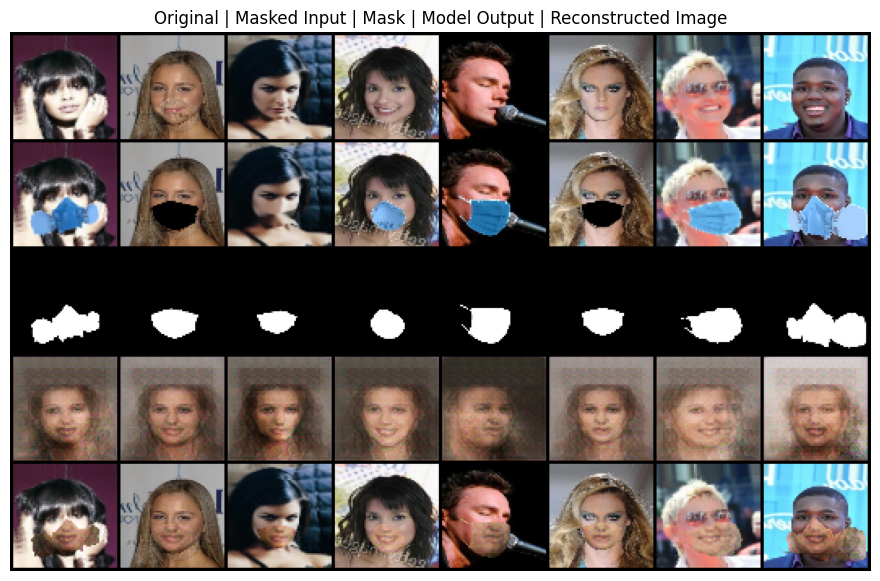

Visualization saved: training_runs/run_1/visualizations/epoch_180.png

Epoch 181/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, g_loss=78.2886, d_loss=0.5032, g_l1_loss=0.4095, g_adv_loss=0.6931, g_recon_loss=0.0235, g_perceptual_loss=0.0000, psnr=12.1311, ssim=0.3742]



Epoch 182/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.88it/s, g_loss=79.4314, d_loss=0.5032, g_l1_loss=0.4194, g_adv_loss=0.6931, g_recon_loss=0.0247, g_perceptual_loss=0.0000, psnr=12.0720, ssim=0.3665]



Epoch 183/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.89it/s, g_loss=78.7262, d_loss=0.5033, g_l1_loss=0.4097, g_adv_loss=0.6930, g_recon_loss=0.0260, g_perceptual_loss=0.0000, psnr=12.1741, ssim=0.3683]



Epoch 184/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.84it/s, g_loss=80.4879, d_loss=0.5032, g_l1_loss=0.4047, g_adv_loss=0.6931, g_recon_loss=0.0250, g_perceptual_loss=0.0000, psnr=12.2773, ssim=0.3612]



Epoch 185/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s, g_loss=77.5560, d_loss=0.5032, g_l1_loss=0.3986, g_adv_loss=0.6931, g_recon_loss=0.0234, g_perceptual_loss=0.0000, psnr=12.4233, ssim=0.3714]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 186/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=76.6663, d_loss=0.5032, g_l1_loss=0.3959, g_adv_loss=0.6931, g_recon_loss=0.0227, g_perceptual_loss=0.0000, psnr=12.4278, ssim=0.3777]


Best model saved: training_runs/run_1/best_model.pth

Epoch 187/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s, g_loss=78.2374, d_loss=0.5032, g_l1_loss=0.4055, g_adv_loss=0.6931, g_recon_loss=0.0258, g_perceptual_loss=0.0000, psnr=12.3151, ssim=0.3691]



Epoch 188/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s, g_loss=77.5464, d_loss=0.5032, g_l1_loss=0.4033, g_adv_loss=0.6931, g_recon_loss=0.0229, g_perceptual_loss=0.0000, psnr=12.3160, ssim=0.3685]



Epoch 189/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.76it/s, g_loss=76.2006, d_loss=0.5032, g_l1_loss=0.3925, g_adv_loss=0.6931, g_recon_loss=0.0224, g_perceptual_loss=0.0000, psnr=12.5906, ssim=0.3792]


Best model saved: training_runs/run_1/best_model.pth

Epoch 190/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=81.7348, d_loss=0.5032, g_l1_loss=0.4276, g_adv_loss=0.6931, g_recon_loss=0.0256, g_perceptual_loss=0.0000, psnr=11.7898, ssim=0.3630]

Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


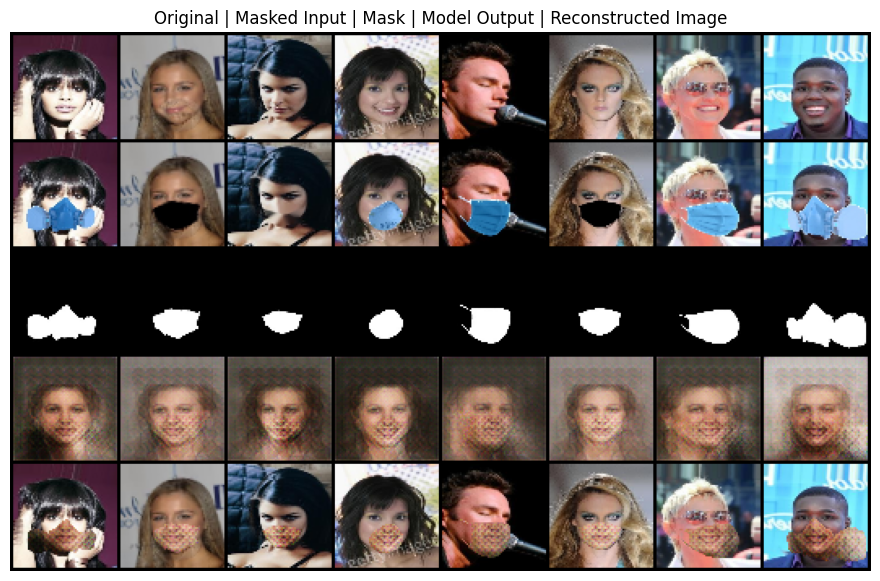

Visualization saved: training_runs/run_1/visualizations/epoch_190.png

Epoch 191/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.00it/s, g_loss=77.4423, d_loss=0.5032, g_l1_loss=0.4019, g_adv_loss=0.6931, g_recon_loss=0.0235, g_perceptual_loss=0.0000, psnr=12.3451, ssim=0.3784]



Epoch 192/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.88it/s, g_loss=79.0290, d_loss=0.5032, g_l1_loss=0.4137, g_adv_loss=0.6931, g_recon_loss=0.0259, g_perceptual_loss=0.0000, psnr=12.0967, ssim=0.3701]



Epoch 193/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.93it/s, g_loss=78.2408, d_loss=0.5033, g_l1_loss=0.4070, g_adv_loss=0.6929, g_recon_loss=0.0239, g_perceptual_loss=0.0000, psnr=12.1884, ssim=0.3767]



Epoch 194/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.77it/s, g_loss=76.5585, d_loss=0.5032, g_l1_loss=0.3968, g_adv_loss=0.6931, g_recon_loss=0.0224, g_perceptual_loss=0.0000, psnr=12.5434, ssim=0.3758]



Epoch 195/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s, g_loss=78.6353, d_loss=0.5032, g_l1_loss=0.4112, g_adv_loss=0.6931, g_recon_loss=0.0259, g_perceptual_loss=0.0000, psnr=12.1211, ssim=0.3749]


Checkpoint saved: training_runs/run_1/regular_checkpoint.pth

Epoch 196/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s, g_loss=78.1198, d_loss=0.5032, g_l1_loss=0.4085, g_adv_loss=0.6931, g_recon_loss=0.0235, g_perceptual_loss=0.0000, psnr=12.2376, ssim=0.3721]



Epoch 197/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, g_loss=76.3495, d_loss=0.5032, g_l1_loss=0.3934, g_adv_loss=0.6931, g_recon_loss=0.0226, g_perceptual_loss=0.0000, psnr=12.4658, ssim=0.3820]



Epoch 198/200


Validating: 100%|██████████| 4/4 [00:02<00:00,  1.93it/s, g_loss=77.4976, d_loss=0.5032, g_l1_loss=0.3998, g_adv_loss=0.6931, g_recon_loss=0.0255, g_perceptual_loss=0.0000, psnr=12.3753, ssim=0.3777]



Epoch 199/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.00it/s, g_loss=78.0945, d_loss=0.5033, g_l1_loss=0.4102, g_adv_loss=0.6931, g_recon_loss=0.0235, g_perceptual_loss=0.0000, psnr=12.1557, ssim=0.3799]



Epoch 200/200


Validating: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s, g_loss=77.7024, d_loss=0.5032, g_l1_loss=0.4039, g_adv_loss=0.6931, g_recon_loss=0.0240, g_perceptual_loss=0.0000, psnr=12.3383, ssim=0.3766]


Training metrics:
g_loss: 73.1627
d_loss: 0.5032
g_l1_loss: 0.3714
g_adv_loss: 0.6931
g_recon_loss: 0.0218
g_perceptual_loss: 6.6294
psnr: 12.9661
ssim: 0.3978

Validation metrics:
g_loss: 77.7024
d_loss: 0.5032
g_l1_loss: 0.4039
g_adv_loss: 0.6931
g_recon_loss: 0.0240
g_perceptual_loss: 0.0000
psnr: 12.3383
ssim: 0.3766
Checkpoint saved: training_runs/run_1/regular_checkpoint.pth


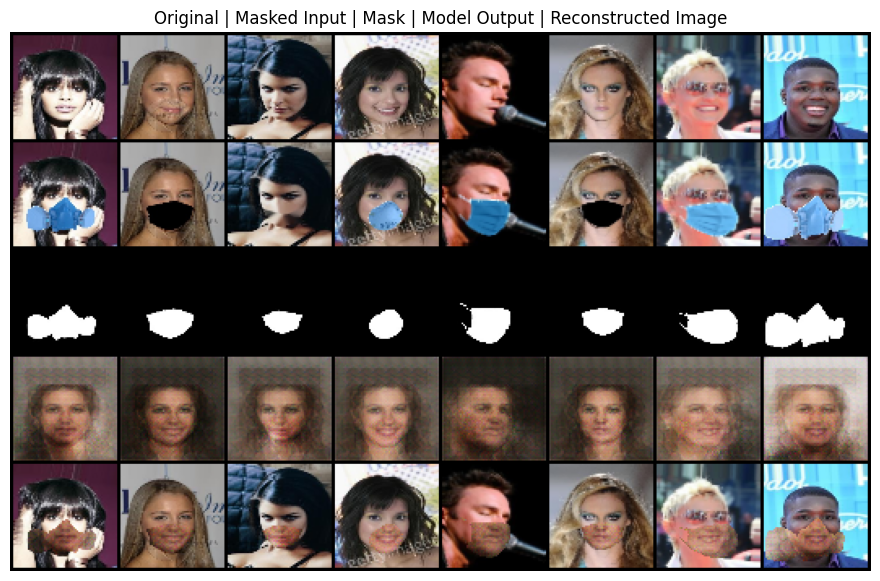

Visualization saved: training_runs/run_1/visualizations/epoch_200.png
Final model saved: training_runs/run_1/final_model.pth
Training log saved to training_runs/run_1/training_log.csv


In [20]:
# Initialize models and optimizers
generator = PartialUNet(in_channels=4, out_channels=3)
discriminator = PatchDiscriminator(in_channels=3)
g_optimizer = torch.optim.Adam(generator.parameters(), 
                              lr=2e-4,              # Reduce learning rate
                              betas=(0.5, 0.999))   # Keep these betas

d_optimizer = torch.optim.Adam(discriminator.parameters(), 
                              lr=1e-4,              # Lower discriminator learning rate
                              betas=(0.5, 0.999))

# Create trainer
trainer = InpaintingTrainer(
    generator=generator,
    discriminator=discriminator,
    device=device,
    lambda_l1=100.0,
    lambda_adv=1,
    lambda_recon=100.0,
    lambda_perceptual=5.0
)

# Train model
metrics = train_model(
    trainer=trainer,
    train_loader=train_loader,
    val_loader=val_loader,
    g_optimizer=g_optimizer,
    d_optimizer=d_optimizer,
    num_epochs=200,
    save_dir='training_runs/run_1',
    save_freq=5,
    viz_freq=10,
    resume_path=None  # Optional path to resume training
)

In [14]:
def visualize_inpainting_results(trainer, dataloader, checkpoint_path, num_images=4, device='cuda'):
    """
    Visualizes original image, ground truth, binary mask, model output, and reconstructed image.

    Args:
        trainer: InpaintingTrainer instance.
        dataloader: DataLoader for visualization.
        checkpoint_path: Path to the model checkpoint.
        num_images: Number of images to visualize.
        device: Device ('cuda' or 'cpu').

    """
    # Load checkpoint
    trainer.load_checkpoint(checkpoint_path)

    trainer.generator.eval()

    # Get a random batch
    batch = next(iter(dataloader))
    real_images = batch['image'][:num_images].to(device)
    masked_inputs = batch['masked_input'][:num_images].to(device)
    masks = batch['mask'][:num_images].float().to(device) / 255.0

    # Generate outputs
    with torch.no_grad():
        fake_images = trainer.generator(masked_inputs, masks)

    # Reconstruct image (real + inpainted)
    masks_expanded = masks.expand_as(real_images)
    reconstructed_images = real_images * (1 - masks_expanded) + fake_images * masks_expanded

    # Denormalize for visualization
    def denorm(x):
        return (x + 1) / 2

    real_images = denorm(real_images)
    masked_inputs = denorm(masked_inputs[:, :3, :, :])  # Extract only the RGB part
    fake_images = denorm(fake_images)
    reconstructed_images = denorm(reconstructed_images)
    masks_vis = masks.repeat(1, 3, 1, 1)  # Convert masks to 3 channels for visualization

    # Create visualization grid
    vis_images = torch.cat([
        real_images,
        masked_inputs,
        masks_vis,
        fake_images,
        reconstructed_images
    ], dim=0)

    grid = make_grid(vis_images, nrow=num_images, padding=5, normalize=False)

    # Plot the grid
    plt.figure(figsize=(15, 8))
    plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
    plt.axis('off')
    plt.title("Original | Masked Input | Mask | Model Output | Reconstructed Image")
    plt.show()

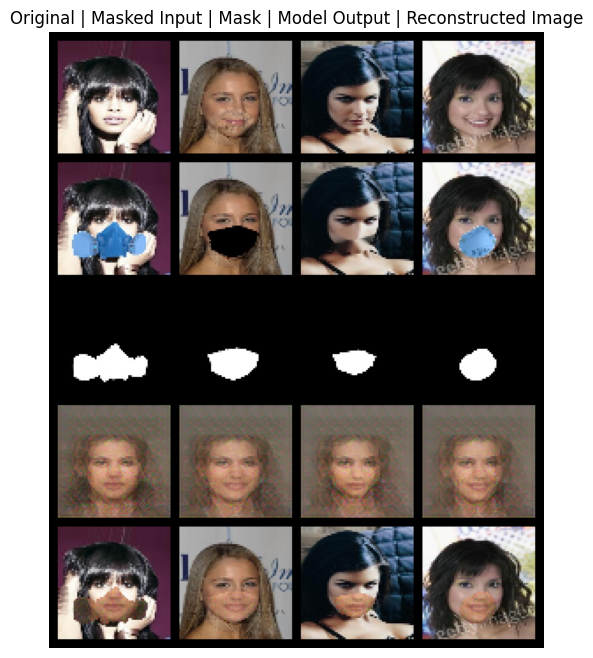

In [15]:
visualize_inpainting_results(trainer, val_loader, '/kaggle/working/training_runs/run_1/best_model.pth')